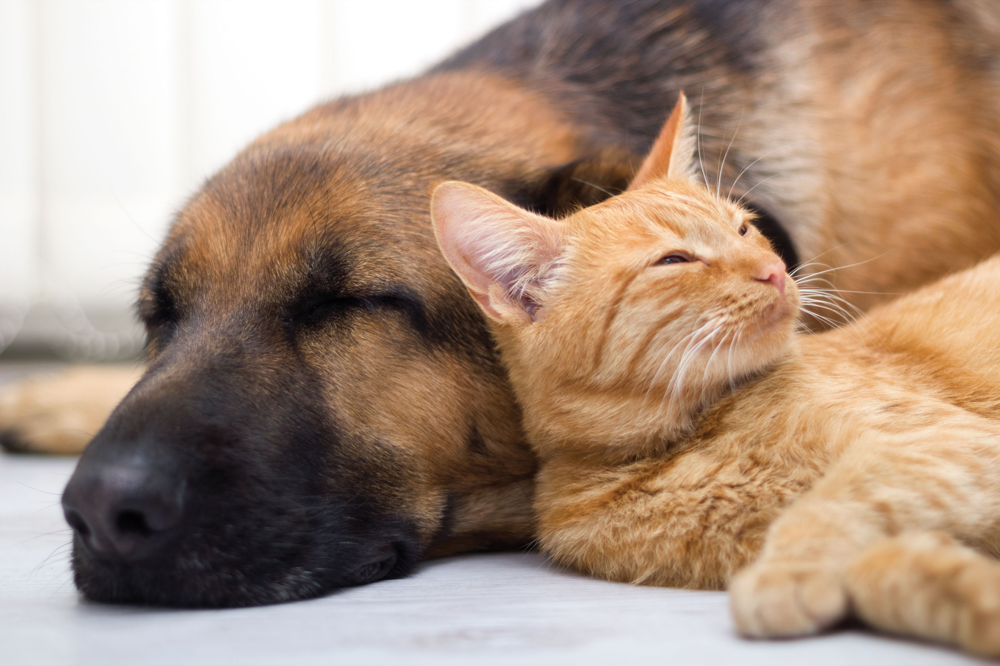


# Cats and Dogs Image Classifaction

In this notebook, we are going to use Deep Learning with TensorFlow to classify wether an image is a cat or dog.


### What we are going to do:



1. Load the data
2. Visualize the data
3. Preprocess the data
4. modelling experimentations
5. choose the baest model and evaluate it on the real world
6. save and export the model.

## 1. Load the data

I have downloaded the data on [Kaggle.com](https://www.kaggle.com/). There are 12500 images of cats and 12500 images of dogs. The data was not preprocessed (all images of a single folder), Therefore I've created a simple python script [here](https://drive.google.com/file/d/1sivJQm4nJLSNLnC-D9gonHQdTPq6xnAH/view?usp=sharing) to split the images into different folders, Train, Validation and test all containing subfolders of cat and dog images. The Test folder contains 10% and the validation folder 15% of the dataset (25000) images.

You can get the data [here](https://drive.google.com/file/d/1w2Z-XREFr7bCLfLCJ5dKPo4osOsjjZxx/view?usp=sharing).

In [1]:
import zipfile

# get the file path
dog_cats_file_path = '/content/drive/MyDrive/DataScience/DeepLearning/Tensorflow/Practice/Datasets/cats_dogs.zip'

# unzip the file
zipref = zipfile.ZipFile(dog_cats_file_path)
zipref.extractall()
zipref.close()

In [ ]:
# check what's inside the folder
!ls cats_dogs

script.py  test  train	val


In [ ]:
import os

# walkthrough  every directories of cats_dogs and list the files

for dirpath, dirnames, filenames in os.walk('cats_dogs'):
  print(f'There are {len(dirnames)} directories and {len(filenames)} file in {dirpath}')

There are 3 directories and 1 file in cats_dogs
There are 2 directories and 0 file in cats_dogs/test
There are 0 directories and 2500 file in cats_dogs/test/cats
There are 0 directories and 2500 file in cats_dogs/test/dogs
There are 2 directories and 0 file in cats_dogs/train
There are 0 directories and 6250 file in cats_dogs/train/cats
There are 0 directories and 6250 file in cats_dogs/train/dogs
There are 2 directories and 0 file in cats_dogs/val
There are 0 directories and 3750 file in cats_dogs/val/cats
There are 0 directories and 3750 file in cats_dogs/val/dogs


In [ ]:
# create path for train, val and test folders

train_dir  = 'cats_dogs/train'
val_dir = 'cats_dogs/val'
test_dir = 'cats_dogs/test'

In [ ]:
len(os.listdir(train_dir + '/' + 'cats'))

6250

## 2. Visualize the data

We are going randomly visualize the image of a given class

In [ ]:
import random
import matplotlib.pyplot as plt

def view_random_image(target_dir, target_class):
    # create image path
    image_path = os.path.join(target_dir, target_class)
    # randomly choose an image filename inside a list of images filename generated by 'os.listdir()' and
    # join it with the image path to create the abs path of the image
    random_image_file_name = os.path.join(image_path, random.choice(os.listdir(image_path)))

    # read the image
    img = plt.imread(random_image_file_name)
    # plot the image
    plt.imshow(img)
    print(f"Image shape: {img.shape}")
    plt.axis(False)

    return img

Image shape: (441, 451, 3)


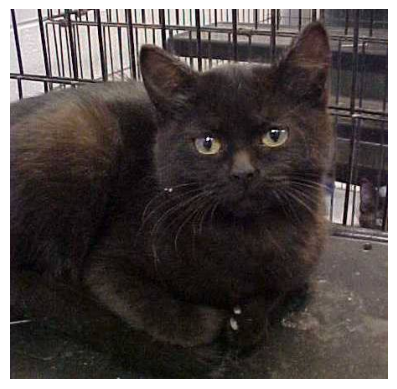

In [ ]:
img = view_random_image(target_dir=train_dir, target_class='cats')

Image shape: (266, 216, 3)


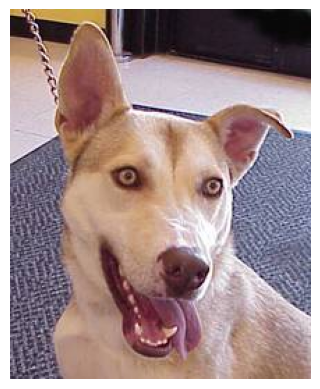

In [ ]:
img = view_random_image(target_dir=train_dir, target_class='dogs')

## 3. Preprocess The data

The data is not fully preprocessed. Before uploading the data, I just splited the data into train, validation and test set. But before we fit the data to a model, more preprocessing steps are required. We need to:
- Scale the data
- Resize the data (reshaping)
- Put the data into batches
- Data augmentation (optional)

We are going to do all those steps into into one using `ImageDataGenerator()` class from Tensorflow.

We are going to preprocess the data with and without data augmentation to compare the results. Also, we are going to use 10% of the training set for faster experimentation, then after use the whole data images.

In [ ]:
import os
import random
import shutil

# get 10 percent of the dataset

# Directory paths
train_dir = 'cats_dogs/train'
val_dir = 'cats_dogs/val'
test_dir = 'cats_dogs/test'
cats_dogs_10_percent_path = 'cats_dogs_10_percent'

# Ratios
train_ratio = 0.1
val_ratio = 0.1
test_ratio = 0.1

def copy_files(src_dir, dst_dir, class_name, file_list):
    for filename in file_list:
        src_path = os.path.join(src_dir, class_name, filename)
        dst_path = os.path.join(dst_dir, class_name)
        shutil.copy(src_path, dst_path)

def create_10_percent_dataset(src_dir, dst_dir, ratio):
    os.makedirs(dst_dir, exist_ok=True)
    for class_name in ['cats', 'dogs']:
        os.makedirs(os.path.join(dst_dir, class_name), exist_ok=True)

        class_files = os.listdir(os.path.join(src_dir, class_name))
        random.shuffle(class_files)
        num_files_to_copy = int(len(class_files) * ratio)
        selected_files = class_files[:num_files_to_copy]

        copy_files(src_dir, dst_dir, class_name, selected_files)

create_10_percent_dataset(train_dir, os.path.join(cats_dogs_10_percent_path, 'train'), train_ratio)
create_10_percent_dataset(val_dir, os.path.join(cats_dogs_10_percent_path, 'val'), val_ratio)
create_10_percent_dataset(test_dir, os.path.join(cats_dogs_10_percent_path, 'test'), test_ratio)


In [ ]:
for dirpath, dirnames, filenames in os.walk('cats_dogs_10_percent'):
  print(f'There are {len(dirnames)} directories and {len(filenames)} files in {dirpath}')

There are 3 directories and 0 files in cats_dogs_10_percent
There are 2 directories and 0 files in cats_dogs_10_percent/test
There are 0 directories and 250 files in cats_dogs_10_percent/test/cats
There are 0 directories and 250 files in cats_dogs_10_percent/test/dogs
There are 2 directories and 0 files in cats_dogs_10_percent/train
There are 0 directories and 625 files in cats_dogs_10_percent/train/cats
There are 0 directories and 625 files in cats_dogs_10_percent/train/dogs
There are 2 directories and 0 files in cats_dogs_10_percent/val
There are 0 directories and 375 files in cats_dogs_10_percent/val/cats
There are 0 directories and 375 files in cats_dogs_10_percent/val/dogs


### Use 10 percent of the data without data augmentation

Here we are going to use 10 percent of the data without augmented data.


In [ ]:
from tensorflow._api.v2.random import shuffle
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf

# rescale, reshape the data and turn it into batches

tf.random.set_seed(42)

train_dir_10_percent = 'cats_dogs_10_percent/train'
val_dir_10_percent = 'cats_dogs_10_percent/val'
test_dir_10_percent = 'cats_dogs_10_percent/test'

IMG_SHAPE = (224, 224)
BATCH_SIZE = 32



image_data_gen_10_percent_train = ImageDataGenerator(rescale=1./255).flow_from_directory(directory=train_dir_10_percent,
                                                                                        batch_size=BATCH_SIZE,
                                                                                        target_size=IMG_SHAPE,
                                                                                        class_mode='binary',
                                                                                        seed=42)

image_data_gen_10_percent_val = ImageDataGenerator(rescale=1./255).flow_from_directory(directory=val_dir_10_percent,
                                                                                       batch_size=BATCH_SIZE,
                                                                                       target_size=IMG_SHAPE,
                                                                                       class_mode='binary',
                                                                                       seed=42)

image_data_gen_10_percent_test = ImageDataGenerator(rescale=1./255).flow_from_directory(directory=test_dir_10_percent,
                                                                                        batch_size=BATCH_SIZE,
                                                                                        target_size=IMG_SHAPE,
                                                                                        class_mode='binary',
                                                                                        seed=42)

Found 1250 images belonging to 2 classes.
Found 750 images belonging to 2 classes.
Found 500 images belonging to 2 classes.


In [ ]:
# check how many bacthes are there
len(image_data_gen_10_percent_train)

40

In [ ]:
# take the next bacth
images, labels = image_data_gen_10_percent_train.next()

In [ ]:
# check the shape of the first batch
images.shape

(32, 224, 224, 3)

In [ ]:
images[0].shape

(224, 224, 3)

(-0.5, 223.5, 223.5, -0.5)

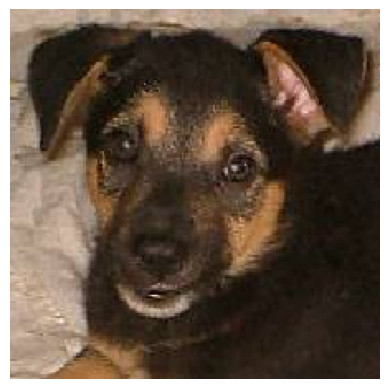

In [ ]:
# plot the image
plt.imshow(images[0])
plt.axis(False)

In [ ]:
labels[0]

1.0

In [ ]:
labels # cat: 0
       # dog: 1

array([1., 1., 0., 1., 0., 0., 1., 0., 0., 0., 1., 1., 0., 0., 1., 1., 1.,
       1., 1., 1., 0., 1., 1., 1., 0., 0., 0., 1., 1., 1., 1., 1.],
      dtype=float32)

## 4. Modelling experimentations

Here we are going to run many experimentation by building and comparing many models.

We are going to:

1. Create a baseline model and fit it with the 10 percent of non augmented data
2. Create other models to beat the baseline using the he 10 percent of non augmented data
3. Try to achieve better performence buy building other models that have beaten the baseline
4. Use he 10 percent of augmented data and repeat step 1 to 3
5. Use the full data non augmented and repeat step 1 to 3
6. Use the full data augmented and repeat step 1 to 3
7. Use a pre-trained model for check if it can reach better performences
8. Evaluate the best model
9. Use the best model on real world data
10. Save and export the model for a web application using streamlit



### 1. Create a baseline model and fit it with the 10 percent of non augmented data

Our baseline model will be a simple model composed of many fully connected layers (Dense layer) to see how it can perform of images.

In [ ]:
import tensorflow as tf
from tensorflow.keras import Sequential, layers, activations, losses, optimizers

In [ ]:
# create the model
model_0 = Sequential([
    layers.Flatten(input_shape=(224, 224, 3), name='input_layer'),
    layers.Dense(100, activation=activations.relu),
    layers.Dense(100, activation=activations.relu),
    layers.Dense(100, activation=activations.relu),
    layers.Dense(1, activation=activations.sigmoid, name='output_layer')
])

# compile the model
model_0.compile(loss=losses.BinaryCrossentropy(),
                optimizer=optimizers.SGD(),
                metrics=['accuracy'])

model_0.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (Flatten)       (None, 150528)            0         
                                                                 
 dense (Dense)               (None, 100)               15052900  
                                                                 
 dense_1 (Dense)             (None, 100)               10100     
                                                                 
 dense_2 (Dense)             (None, 100)               10100     
                                                                 
 output_layer (Dense)        (None, 1)                 101       
                                                                 
Total params: 15,073,201
Trainable params: 15,073,201
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# fit the model
history_0 = model_0.fit(image_data_gen_10_percent_train,
            validation_data=image_data_gen_10_percent_val,
            steps_per_epoch=len(image_data_gen_10_percent_train),
            validation_steps=len(image_data_gen_10_percent_val),
            epochs=10)

Epoch 1/10
40/40 [==============================] - 11s 117ms/step - loss: 0.7843 - accuracy: 0.5168 - val_loss: 0.7186 - val_accuracy: 0.5000
Epoch 2/10
40/40 [==============================] - 6s 146ms/step - loss: 0.6969 - accuracy: 0.5048 - val_loss: 0.6927 - val_accuracy: 0.5040
Epoch 3/10
40/40 [==============================] - 4s 107ms/step - loss: 0.6912 - accuracy: 0.5136 - val_loss: 0.6885 - val_accuracy: 0.5080
Epoch 4/10
40/40 [==============================] - 6s 142ms/step - loss: 0.6835 - accuracy: 0.5552 - val_loss: 0.6846 - val_accuracy: 0.5680
Epoch 5/10
40/40 [==============================] - 6s 149ms/step - loss: 0.6903 - accuracy: 0.5512 - val_loss: 0.6852 - val_accuracy: 0.5680
Epoch 6/10
40/40 [==============================] - 5s 129ms/step - loss: 0.6806 - accuracy: 0.5776 - val_loss: 0.6967 - val_accuracy: 0.5013
Epoch 7/10
40/40 [==============================] - 5s 136ms/step - loss: 0.6753 - accuracy: 0.5752 - val_loss: 0.6819 - val_accuracy: 0.5747
Epoch

In [ ]:
model_0_accuracy = model_0.evaluate(image_data_gen_10_percent_test)
model_0_accuracy

16/16 [==============================] - 1s 88ms/step - loss: 0.7150 - accuracy: 0.5440


[0.7150483131408691, 0.5440000295639038]

It seems that `model_0` is guessing the output. Let's try to improve it

In [ ]:
# create the model
model_0_1 = Sequential([
    layers.Flatten(input_shape=(224, 224, 3), name='input_layer'),
    layers.Dense(100, activation=activations.relu),
    layers.Dense(100, activation=activations.relu),
    layers.Dense(100, activation=activations.relu),
    layers.Dense(50, activation=activations.relu),
    layers.Dense(50, activation=activations.relu),
    layers.Dense(50, activation=activations.relu),
    layers.Dense(1, activation=activations.sigmoid, name='output_layer')
])

# compile the model
model_0_1.compile(loss=losses.BinaryCrossentropy(),
                optimizer=optimizers.SGD(),
                metrics=['accuracy'])

model_0_1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (Flatten)       (None, 150528)            0         
                                                                 
 dense_3 (Dense)             (None, 100)               15052900  
                                                                 
 dense_4 (Dense)             (None, 100)               10100     
                                                                 
 dense_5 (Dense)             (None, 100)               10100     
                                                                 
 dense_6 (Dense)             (None, 50)                5050      
                                                                 
 dense_7 (Dense)             (None, 50)                2550      
                                                                 
 dense_8 (Dense)             (None, 50)               

In [ ]:
# fit the model
history_0_1 = model_0_1.fit(image_data_gen_10_percent_train,
            validation_data=image_data_gen_10_percent_val,
            steps_per_epoch=len(image_data_gen_10_percent_train),
            validation_steps=len(image_data_gen_10_percent_val),
            epochs=10)

Epoch 1/10
40/40 [==============================] - 6s 115ms/step - loss: 0.6980 - accuracy: 0.5016 - val_loss: 0.6921 - val_accuracy: 0.5693
Epoch 2/10
40/40 [==============================] - 5s 117ms/step - loss: 0.6966 - accuracy: 0.4992 - val_loss: 0.6916 - val_accuracy: 0.5600
Epoch 3/10
40/40 [==============================] - 5s 129ms/step - loss: 0.6952 - accuracy: 0.5280 - val_loss: 0.6923 - val_accuracy: 0.5013
Epoch 4/10
40/40 [==============================] - 5s 136ms/step - loss: 0.6959 - accuracy: 0.5000 - val_loss: 0.6906 - val_accuracy: 0.5787
Epoch 5/10
40/40 [==============================] - 4s 110ms/step - loss: 0.6924 - accuracy: 0.5224 - val_loss: 0.6913 - val_accuracy: 0.4987
Epoch 6/10
40/40 [==============================] - 4s 106ms/step - loss: 0.6884 - accuracy: 0.5448 - val_loss: 0.6898 - val_accuracy: 0.4933
Epoch 7/10
40/40 [==============================] - 6s 140ms/step - loss: 0.6823 - accuracy: 0.5664 - val_loss: 0.6923 - val_accuracy: 0.5093
Epoch 

In [ ]:
model_0_1_accuracy = model_0_1.evaluate(image_data_gen_10_percent_test)
model_0_1_accuracy

16/16 [==============================] - 1s 63ms/step - loss: 0.6794 - accuracy: 0.5780


[0.6793586611747742, 0.578000009059906]

Lets' try to remove some layers and changing the optimizer to check if there's some improvments

In [ ]:
# create the model
model_0_2 = Sequential([
    layers.Flatten(input_shape=(224, 224, 3), name='input_layer'),
    layers.Dense(100, activation=activations.relu),
    layers.Dense(100, activation=activations.relu),
    layers.Dense(50, activation=activations.relu),
    layers.Dense(50, activation=activations.relu),
    layers.Dense(1, activation=activations.sigmoid, name='output_layer')
])

# compile the model
model_0_2.compile(loss=losses.BinaryCrossentropy(),
                optimizer=optimizers.Adam(),
                metrics=['accuracy'])

model_0_2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (Flatten)       (None, 150528)            0         
                                                                 
 dense_9 (Dense)             (None, 100)               15052900  
                                                                 
 dense_10 (Dense)            (None, 100)               10100     
                                                                 
 dense_11 (Dense)            (None, 50)                5050      
                                                                 
 dense_12 (Dense)            (None, 50)                2550      
                                                                 
 output_layer (Dense)        (None, 1)                 51        
                                                                 
Total params: 15,070,651
Trainable params: 15,070,651


In [ ]:
# fit the model
history_0_2 = model_0_2.fit(image_data_gen_10_percent_train,
            validation_data=image_data_gen_10_percent_val,
            steps_per_epoch=len(image_data_gen_10_percent_train),
            validation_steps=len(image_data_gen_10_percent_val),
            epochs=10)

Epoch 1/10
40/40 [==============================] - 8s 115ms/step - loss: 6.2492 - accuracy: 0.5128 - val_loss: 2.3981 - val_accuracy: 0.5000
Epoch 2/10
40/40 [==============================] - 6s 141ms/step - loss: 1.8714 - accuracy: 0.5232 - val_loss: 1.2154 - val_accuracy: 0.4973
Epoch 3/10
40/40 [==============================] - 4s 104ms/step - loss: 1.8539 - accuracy: 0.5320 - val_loss: 0.7421 - val_accuracy: 0.5747
Epoch 4/10
40/40 [==============================] - 6s 153ms/step - loss: 0.7797 - accuracy: 0.5368 - val_loss: 0.7320 - val_accuracy: 0.5293
Epoch 5/10
40/40 [==============================] - 4s 112ms/step - loss: 0.9139 - accuracy: 0.5096 - val_loss: 0.6950 - val_accuracy: 0.5627
Epoch 6/10
40/40 [==============================] - 4s 105ms/step - loss: 0.7045 - accuracy: 0.5712 - val_loss: 0.8374 - val_accuracy: 0.5013
Epoch 7/10
40/40 [==============================] - 6s 157ms/step - loss: 0.8120 - accuracy: 0.5832 - val_loss: 0.8252 - val_accuracy: 0.5227
Epoch 

In [ ]:
model_0_2_accuracy = model_0_2.evaluate(image_data_gen_10_percent_test)
model_0_2_accuracy

16/16 [==============================] - 1s 68ms/step - loss: 0.7301 - accuracy: 0.5760


[0.7301456332206726, 0.5759999752044678]

In [ ]:
history_0.history['accuracy']

[0.5167999863624573,
 0.504800021648407,
 0.5135999917984009,
 0.5551999807357788,
 0.5511999726295471,
 0.5776000022888184,
 0.5752000212669373,
 0.5600000023841858,
 0.5831999778747559,
 0.6015999913215637]

In [ ]:
# let's create a function to visualize the loass curve
def plot_loss_curve(model_history, model_name):
  accuracy = model_history['accuracy']
  val_accuracy = model_history['val_accuracy']
  loss = model_history['loss']
  val_loss = model_history['val_loss']
  epochs = range(len(accuracy))

  plt.plot(epochs, accuracy, label='train_accuarcy')
  plt.plot(epochs, val_accuracy, label='val_accuracy')
  plt.xlabel('epochs')
  plt.ylabel('accuracy')
  plt.title(model_name + '_accuracy')
  plt.legend()

  plt.figure()


  plt.plot(epochs, loss, label='train_loss')
  plt.plot(epochs, val_loss, label='val_loss')
  plt.xlabel('epochs')
  plt.ylabel('loss')
  plt.title(model_name + '_loss')
  plt.legend()


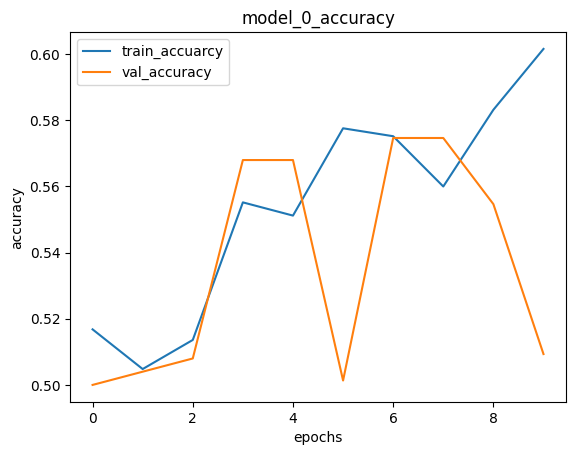

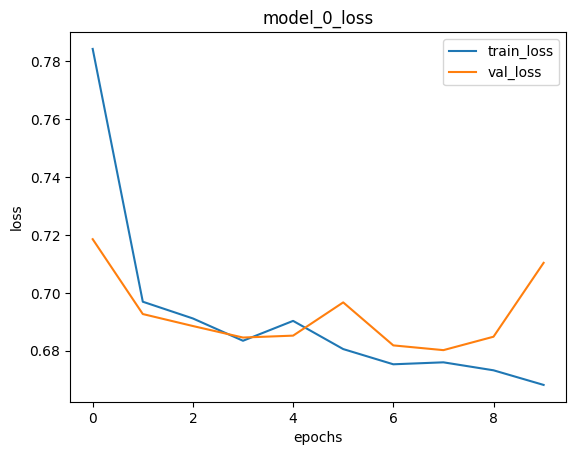

In [ ]:
plot_loss_curve(history_0.history, 'model_0')

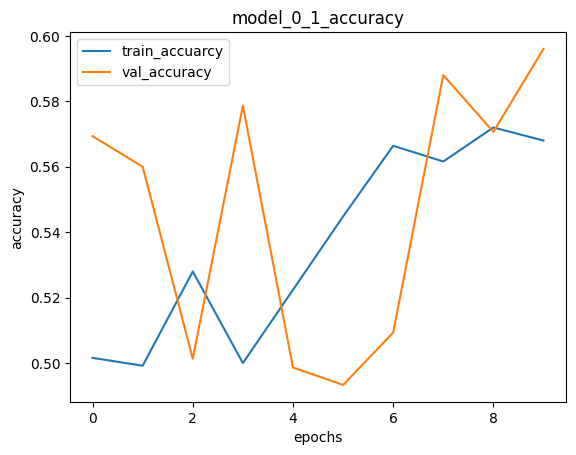

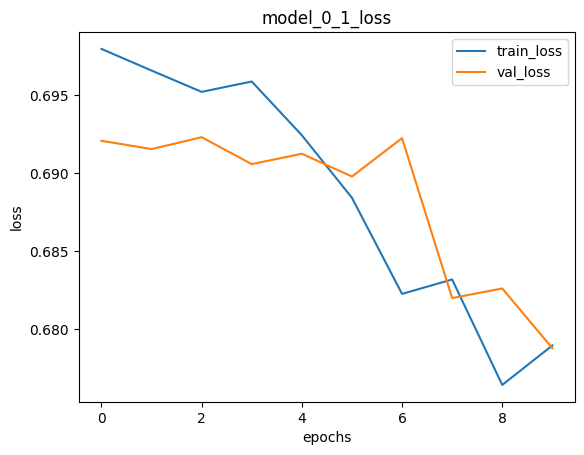

In [ ]:
plot_loss_curve(history_0_1.history, 'model_0_1')

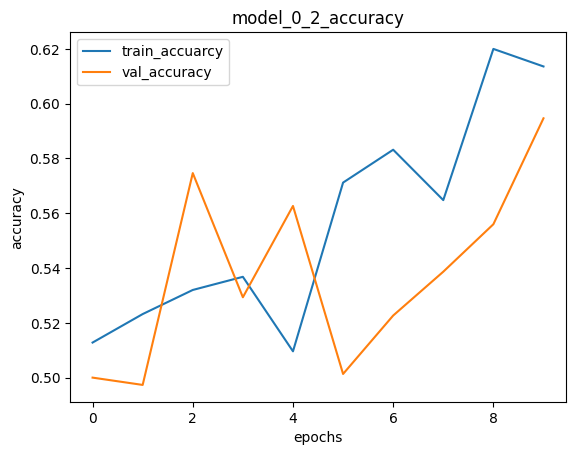

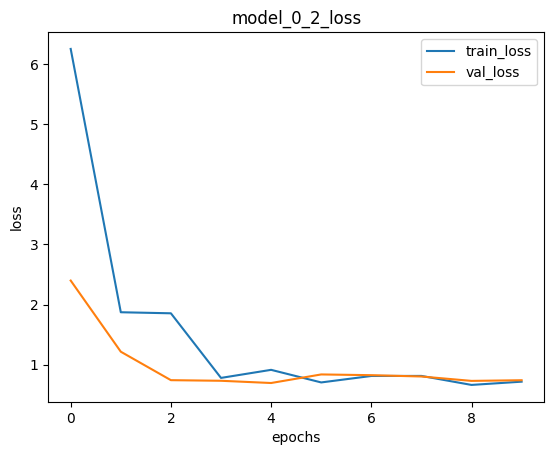

In [ ]:
plot_loss_curve(history_0_2.history, 'model_0_2')

### 2. Create other models to beat the baseline using the he 10 percent of non augmented data

Let's Build CNN models and try to beat `model_0`


In [ ]:
# create the model
model_1 = Sequential([
    layers.Conv2D(input_shape=(224, 224, 3),
                  filters=10,
                  kernel_size=3,
                  strides=1,
                  padding='valid',
                  activation=activations.relu),
    layers.Conv2D(10, 3, activation=activations.relu),
    layers.Conv2D(10, 3, activation=activations.relu),
    layers.Conv2D(10, 3, activation=activations.relu),
    layers.Flatten(),
    layers.Dense(1, activation=activations.sigmoid)
])

# compile the model
model_1.compile(loss=losses.BinaryCrossentropy(),
                optimizer=optimizers.Adam(),
                metrics=['accuracy'])

model_1.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 10)      280       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 conv2d_2 (Conv2D)           (None, 218, 218, 10)      910       
                                                                 
 conv2d_3 (Conv2D)           (None, 216, 216, 10)      910       
                                                                 
 flatten (Flatten)           (None, 466560)            0         
                                                                 
 dense_13 (Dense)            (None, 1)                 466561    
                                                                 
Total params: 469,571
Trainable params: 469,571
Non-tr

In [ ]:
history_1 = model_1.fit(image_data_gen_10_percent_train,
            steps_per_epoch=len(image_data_gen_10_percent_train),
            validation_data=image_data_gen_10_percent_val,
            validation_steps=len(image_data_gen_10_percent_val),
            epochs=10)

Epoch 1/10
40/40 [==============================] - 14s 133ms/step - loss: 1.5352 - accuracy: 0.5304 - val_loss: 0.6788 - val_accuracy: 0.5547
Epoch 2/10
40/40 [==============================] - 5s 114ms/step - loss: 0.6517 - accuracy: 0.6048 - val_loss: 0.6807 - val_accuracy: 0.5853
Epoch 3/10
40/40 [==============================] - 6s 152ms/step - loss: 0.5879 - accuracy: 0.6808 - val_loss: 0.6836 - val_accuracy: 0.5800
Epoch 4/10
40/40 [==============================] - 5s 119ms/step - loss: 0.4815 - accuracy: 0.7944 - val_loss: 0.7452 - val_accuracy: 0.5373
Epoch 5/10
40/40 [==============================] - 6s 153ms/step - loss: 0.2675 - accuracy: 0.8944 - val_loss: 0.9748 - val_accuracy: 0.5640
Epoch 6/10
40/40 [==============================] - 5s 119ms/step - loss: 0.1169 - accuracy: 0.9656 - val_loss: 1.6752 - val_accuracy: 0.5440
Epoch 7/10
40/40 [==============================] - 6s 147ms/step - loss: 0.0493 - accuracy: 0.9896 - val_loss: 2.0062 - val_accuracy: 0.5547
Epoch

In [ ]:
model_1_accuracy = model_1.evaluate(image_data_gen_10_percent_test)
model_1_accuracy

16/16 [==============================] - 2s 103ms/step - loss: 3.1216 - accuracy: 0.5640


[3.1216444969177246, 0.5640000104904175]

We succeed to beat our baseline but we can observe that our model overfit (again) as hell

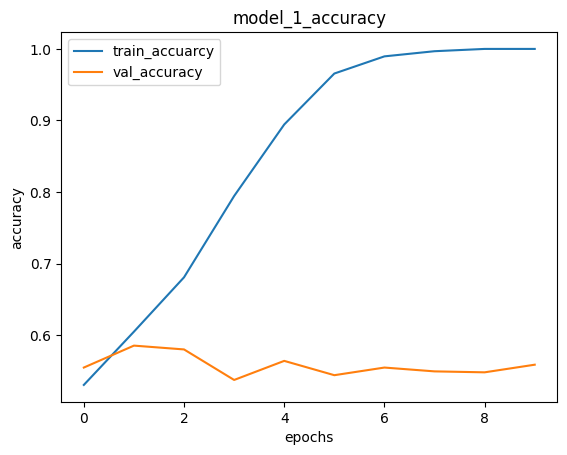

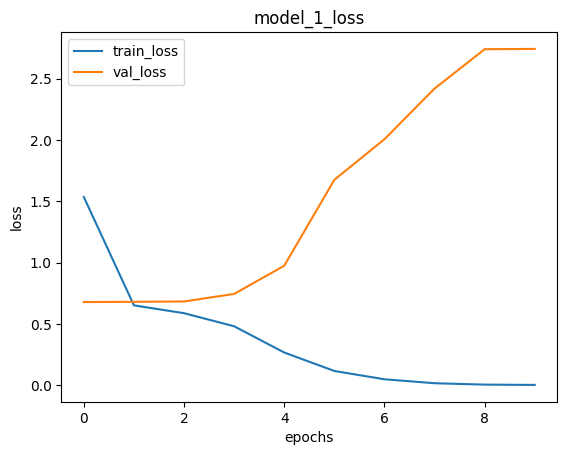

In [ ]:
plot_loss_curve(history_1.history, 'model_1')

### 3. Try to achieve better performence buy building other models that have beaten the baseline

Let's create another CNN (same as model_1) by removing one Conv2D layer

In [ ]:
model_1_1 = Sequential([
    layers.Conv2D(input_shape=(224, 224, 3),
                  filters=10,
                  kernel_size=3,
                  strides=1,
                  padding='valid',
                  activation=activations.relu),
    layers.Conv2D(10, 3, activation=activations.relu),
    layers.Conv2D(10, 3, activation=activations.relu),
    layers.Flatten(),
    layers.Dense(1, activation=activations.sigmoid)
])

model_1_1.compile(loss=losses.BinaryCrossentropy(),
                  optimizer=optimizers.Adam(),
                  metrics=['accuracy'])

model_1_1.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 conv2d_5 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 conv2d_6 (Conv2D)           (None, 218, 218, 10)      910       
                                                                 
 flatten_1 (Flatten)         (None, 475240)            0         
                                                                 
 dense_14 (Dense)            (None, 1)                 475241    
                                                                 
Total params: 477,341
Trainable params: 477,341
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history_1_1 = model_1_1.fit(image_data_gen_10_percent_train,
              steps_per_epoch=len(image_data_gen_10_percent_train),
              validation_data=image_data_gen_10_percent_val,
              validation_steps=len(image_data_gen_10_percent_val),
              epochs=10)

Epoch 1/10
40/40 [==============================] - 7s 123ms/step - loss: 2.2457 - accuracy: 0.5104 - val_loss: 0.6873 - val_accuracy: 0.5547
Epoch 2/10
40/40 [==============================] - 6s 138ms/step - loss: 0.6814 - accuracy: 0.5864 - val_loss: 0.6806 - val_accuracy: 0.6067
Epoch 3/10
40/40 [==============================] - 5s 121ms/step - loss: 0.6180 - accuracy: 0.6560 - val_loss: 0.6857 - val_accuracy: 0.5627
Epoch 4/10
40/40 [==============================] - 6s 155ms/step - loss: 0.4730 - accuracy: 0.7968 - val_loss: 0.6918 - val_accuracy: 0.5747
Epoch 5/10
40/40 [==============================] - 5s 114ms/step - loss: 0.4012 - accuracy: 0.8656 - val_loss: 0.9690 - val_accuracy: 0.5360
Epoch 6/10
40/40 [==============================] - 6s 149ms/step - loss: 0.2198 - accuracy: 0.9272 - val_loss: 0.8957 - val_accuracy: 0.5547
Epoch 7/10
40/40 [==============================] - 5s 122ms/step - loss: 0.0935 - accuracy: 0.9856 - val_loss: 1.2222 - val_accuracy: 0.5747
Epoch 

In [ ]:
model_1_1_accuracy = model_1_1.evaluate(image_data_gen_10_percent_test)
model_1_1_accuracy

16/16 [==============================] - 1s 68ms/step - loss: 1.5530 - accuracy: 0.6140


[1.5529686212539673, 0.6140000224113464]

Despite Removing one Conv2D layer, our model still overfit

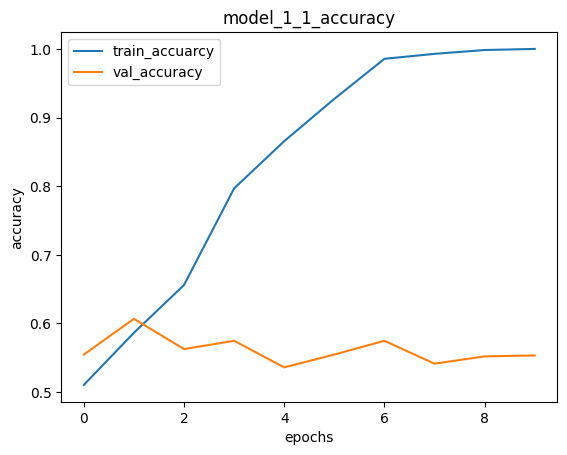

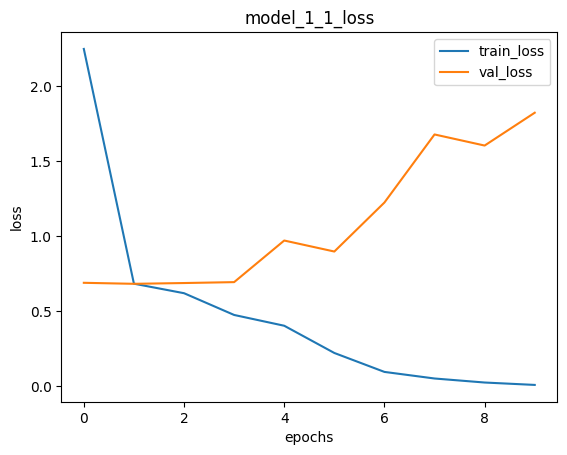

In [ ]:
plot_loss_curve(history_1_1.history, 'model_1_1')

Let's Create another CNN model but this time, we are going add some pooling layers to reduce overfitting

In [ ]:
model_1_2 = Sequential([
    layers.Conv2D(input_shape=(224, 224, 3),
                  filters=10,
                  kernel_size=3,
                  strides=1,
                  padding='valid',
                  activation=activations.relu),
    layers.Conv2D(10, 3, activation=activations.relu),
    layers.MaxPool2D(),
    layers.Conv2D(10, 3, activation=activations.relu),
    layers.Conv2D(10, 3, activation=activations.relu),
    layers.MaxPool2D(),
    layers.Flatten(),
    layers.Dense(1, activation=activations.relu)
])

model_1_2.compile(loss=losses.BinaryCrossentropy(),
              optimizer=optimizers.Adam(),
              metrics=['accuracy'])

model_1_2.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 conv2d_8 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 10)     0         
 )                                                               
                                                                 
 conv2d_9 (Conv2D)           (None, 108, 108, 10)      910       
                                                                 
 conv2d_10 (Conv2D)          (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 53, 53, 10)       0         
 2D)                                                  

In [ ]:
history_1_2 = model_1_2.fit(image_data_gen_10_percent_train,
              validation_data=image_data_gen_10_percent_val,
              steps_per_epoch=len(image_data_gen_10_percent_train),
              validation_steps=len(image_data_gen_10_percent_val),
              epochs=10)

Epoch 1/10
40/40 [==============================] - 9s 131ms/step - loss: 0.7949 - accuracy: 0.5144 - val_loss: 0.6900 - val_accuracy: 0.5600
Epoch 2/10
40/40 [==============================] - 5s 117ms/step - loss: 0.6885 - accuracy: 0.5608 - val_loss: 0.6767 - val_accuracy: 0.5613
Epoch 3/10
40/40 [==============================] - 6s 148ms/step - loss: 0.6292 - accuracy: 0.6512 - val_loss: 0.6591 - val_accuracy: 0.6320
Epoch 4/10
40/40 [==============================] - 4s 112ms/step - loss: 0.7419 - accuracy: 0.6800 - val_loss: 0.6846 - val_accuracy: 0.5587
Epoch 5/10
40/40 [==============================] - 6s 149ms/step - loss: 0.5715 - accuracy: 0.7056 - val_loss: 0.8867 - val_accuracy: 0.6373
Epoch 6/10
40/40 [==============================] - 5s 115ms/step - loss: 0.4663 - accuracy: 0.7960 - val_loss: 0.9147 - val_accuracy: 0.5867
Epoch 7/10
40/40 [==============================] - 6s 144ms/step - loss: 0.3876 - accuracy: 0.8336 - val_loss: 1.7910 - val_accuracy: 0.6040
Epoch 

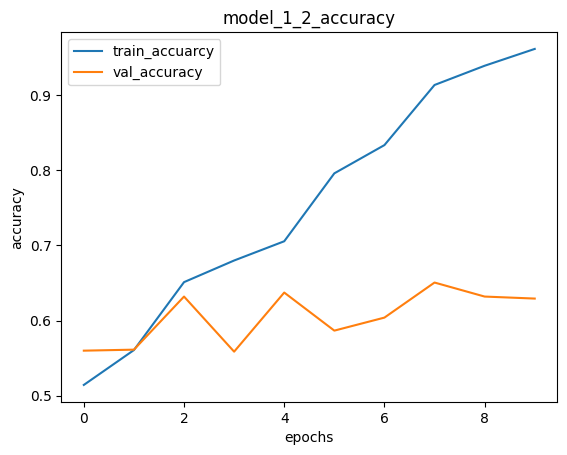

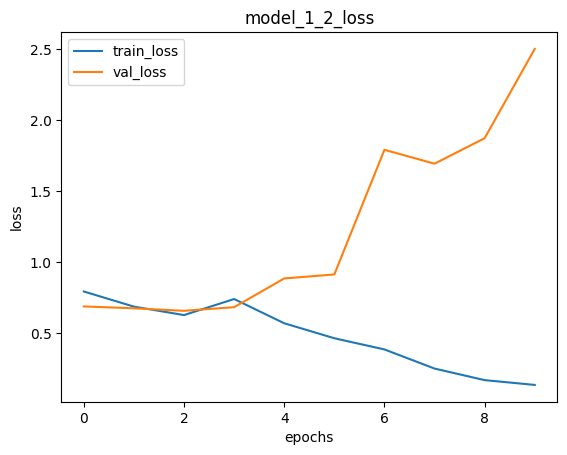

In [ ]:
plot_loss_curve(history_1_2.history, 'model_1_2')

In [ ]:
model_1_2_accuracy = model_1_2.evaluate(image_data_gen_10_percent_test)
model_1_2_accuracy

16/16 [==============================] - 2s 107ms/step - loss: 2.4056 - accuracy: 0.6480


[2.405611515045166, 0.6480000019073486]

In [ ]:
model_1_3 = Sequential([
    layers.Conv2D(input_shape=(224, 224, 3),
                  filters=32,
                  kernel_size=3,
                  strides=1,
                  padding='valid',
                  activation=activations.relu),
    layers.MaxPool2D(),
    layers.Conv2D(32, 3, activation=activations.relu),
    layers.MaxPool2D(),
    layers.Conv2D(32, 3, activation=activations.relu),
    layers.MaxPool2D(),
    layers.Conv2D(32, 3, activation=activations.relu),
    layers.MaxPool2D(),
    layers.Flatten(),
    layers.Dense(1, activation=activations.sigmoid)
])

model_1_3.compile(loss=losses.BinaryCrossentropy(),
                  optimizer=optimizers.Adam(),
                  metrics=['accuracy'])

model_1_3.summary()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_66 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_66 (MaxPoolin  (None, 111, 111, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_67 (Conv2D)          (None, 109, 109, 32)      9248      
                                                                 
 max_pooling2d_67 (MaxPoolin  (None, 54, 54, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_68 (Conv2D)          (None, 52, 52, 32)        9248      
                                                                 
 max_pooling2d_68 (MaxPoolin  (None, 26, 26, 32)     

In [ ]:
history_1_3 = model_1_3.fit(image_data_gen_10_percent_train,
              validation_data=image_data_gen_10_percent_val,
              steps_per_epoch=len(image_data_gen_10_percent_train),
              validation_steps=len(image_data_gen_10_percent_val),
              epochs=10)

Epoch 1/10
40/40 [==============================] - 8s 126ms/step - loss: 0.6922 - accuracy: 0.5352 - val_loss: 0.6898 - val_accuracy: 0.5200
Epoch 2/10
40/40 [==============================] - 6s 139ms/step - loss: 0.6888 - accuracy: 0.5408 - val_loss: 0.6827 - val_accuracy: 0.5640
Epoch 3/10
40/40 [==============================] - 4s 112ms/step - loss: 0.6695 - accuracy: 0.6040 - val_loss: 0.6594 - val_accuracy: 0.6013
Epoch 4/10
40/40 [==============================] - 6s 148ms/step - loss: 0.6529 - accuracy: 0.6048 - val_loss: 0.6993 - val_accuracy: 0.5387
Epoch 5/10
40/40 [==============================] - 5s 122ms/step - loss: 0.6461 - accuracy: 0.6112 - val_loss: 0.6527 - val_accuracy: 0.6307
Epoch 6/10
40/40 [==============================] - 5s 118ms/step - loss: 0.6167 - accuracy: 0.6600 - val_loss: 0.6167 - val_accuracy: 0.6707
Epoch 7/10
40/40 [==============================] - 6s 144ms/step - loss: 0.5827 - accuracy: 0.6808 - val_loss: 0.6381 - val_accuracy: 0.6427
Epoch 

In [ ]:
model_1_3_accuracy = model_1_3.evaluate(image_data_gen_10_percent_test)
model_1_3_accuracy


16/16 [==============================] - 1s 88ms/step - loss: 0.5830 - accuracy: 0.6900


[0.5830241441726685, 0.6899999976158142]

The `model_1_3` is our best performing model so far we an accuracy over 70%. We reach this result just increasing the number of filters and slightly modifiying the architecture of the `model_1_2`

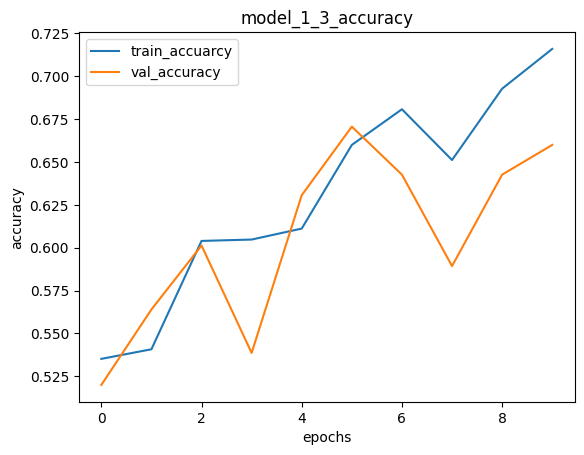

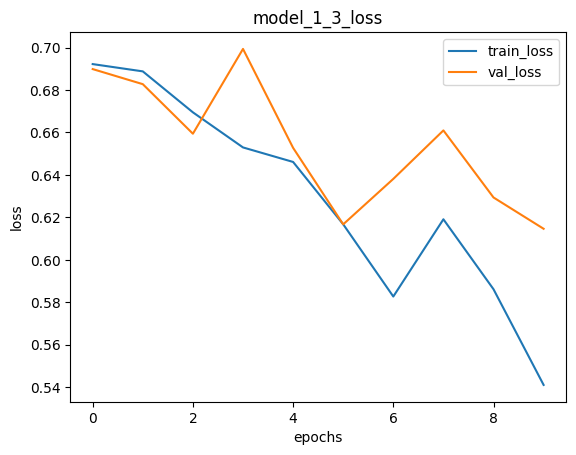

In [ ]:
plot_loss_curve(history_1_3.history, 'model_1_3')

It's good, we have reached better results  but it seems our model still overfitting. This could be due to the lack of data

### 4. Use The 10 percent of augmented data and repeat step 1 to 3

In [ ]:
# Create augmented data

image_data_gen = ImageDataGenerator(rescale=1/255.,
                                    rotation_range=0.2,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    width_shift_range=0.2,
                                    height_shift_range=0.2,
                                    horizontal_flip=True)

image_data_gen_10_percent_aug = image_data_gen.flow_from_directory(directory=train_dir_10_percent,
                                                                    target_size=IMG_SHAPE,
                                                                    batch_size=BATCH_SIZE,
                                                                    class_mode='binary',
                                                                    seed=42)

Found 1250 images belonging to 2 classes.


In [ ]:
# take the next batch
augmented_images, augmeted_labels = image_data_gen_10_percent_aug.next()

In [ ]:
# check the shape
augmented_images.shape

(32, 224, 224, 3)

(-0.5, 223.5, 223.5, -0.5)

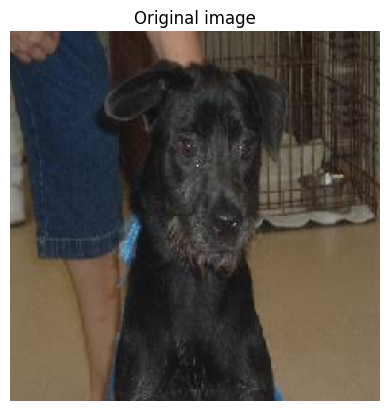

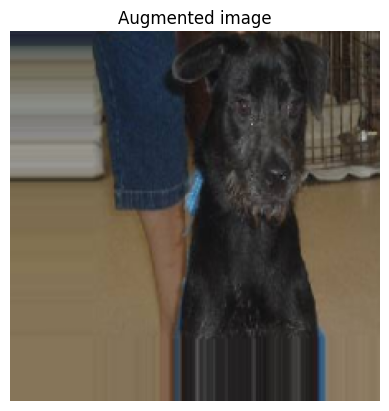

In [ ]:
random_number = random.randint(0, 31)
plt.imshow(images[random_number])
plt.title('Original image')
plt.axis(False)
plt.figure()
plt.imshow(augmented_images[random_number])
plt.title('Augmented image')
plt.axis(False)


Now that we have our augmented images, let's fit it to some models. We are going to use similar architecture of the models we created earlier to compare their performences side by side

In [ ]:
# let's create a function to compare the performence of the same model but with different data
def compare_model_performence(history_1, history_2, model_name):
  # model 1
  accuracy_1 = history_1['accuracy']
  loss_1 = history_1['loss']
  val_accuracy_1 = history_1['val_accuracy']
  val_loss_1 = history_1['val_loss']

  # model_2
  accuracy_2 = history_2['accuracy']
  loss_2 = history_2['loss']
  val_accuracy_2 = history_2['val_accuracy']
  val_loss_2 = history_2['val_loss']

  epochs = range(len(accuracy_1))

  plt.figure(figsize=(12, 8))


  plt.subplot(2, 2, 1)
  plt.plot(epochs, accuracy_1, label='accuracy w/o data aug')
  plt.plot(epochs, accuracy_2, label='accuracy w/ data aug')
  plt.xlabel('epochs')
  plt.ylabel('accuracy')
  plt.legend()
  plt.title(f'{model_name} accuracy')

  plt.subplot(2, 2, 2)
  plt.plot(epochs, loss_1, label='loss w/o data aug')
  plt.plot(epochs, loss_2, label='loss w/ data aug')
  plt.xlabel('epochs')
  plt.ylabel('loss')
  plt.legend()
  plt.title(f'{model_name} loss')


  plt.subplot(2, 2, 3)
  plt.plot(epochs, val_accuracy_1, label='val_accuracy w/o data aug')
  plt.plot(epochs, val_accuracy_2, label='val_accuracy w/ data aug')
  plt.xlabel('epochs')
  plt.ylabel('val_accuracy')
  plt.legend()
  plt.title(f'{model_name} val_accuracy')


  plt.subplot(2, 2, 4)
  plt.plot(epochs, val_loss_1, label='val_loss w/o data aug')
  plt.plot(epochs, val_loss_2, label='val_loss w/ data aug')
  plt.xlabel('epochs')
  plt.ylabel('val_loss')
  plt.legend()
  plt.title(f'{model_name} val_loss')

In [ ]:
from tensorflow.keras.models import clone_model

#### model 0 (Baseline) with augmented data

In [ ]:
model_0.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (Flatten)       (None, 150528)            0         
                                                                 
 dense (Dense)               (None, 100)               15052900  
                                                                 
 dense_1 (Dense)             (None, 100)               10100     
                                                                 
 dense_2 (Dense)             (None, 100)               10100     
                                                                 
 output_layer (Dense)        (None, 1)                 101       
                                                                 
Total params: 15,073,201
Trainable params: 15,073,201
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# clone the model
model_0_copy = clone_model(model_0)

# compile the cloned model
model_0_copy.compile(loss=losses.BinaryCrossentropy(),
                     optimizer=optimizers.Adam(),
                     metrics=['accuracy'])

# fit the model
history_0_copy = model_0_copy.fit(image_data_gen_10_percent_aug,
                 steps_per_epoch=len(image_data_gen_10_percent_aug),
                 validation_data=image_data_gen_10_percent_val,
                 validation_steps=len(image_data_gen_10_percent_val),
                 epochs=10)

Epoch 1/10
40/40 [==============================] - 22s 469ms/step - loss: 5.0967 - accuracy: 0.4824 - val_loss: 2.5042 - val_accuracy: 0.5000
Epoch 2/10
40/40 [==============================] - 18s 462ms/step - loss: 1.3577 - accuracy: 0.5072 - val_loss: 0.8124 - val_accuracy: 0.5613
Epoch 3/10
40/40 [==============================] - 19s 490ms/step - loss: 0.7828 - accuracy: 0.5232 - val_loss: 0.6945 - val_accuracy: 0.5400
Epoch 4/10
40/40 [==============================] - 18s 454ms/step - loss: 0.8791 - accuracy: 0.4952 - val_loss: 0.6845 - val_accuracy: 0.5360
Epoch 5/10
40/40 [==============================] - 18s 456ms/step - loss: 0.7556 - accuracy: 0.5360 - val_loss: 0.8964 - val_accuracy: 0.5107
Epoch 6/10
40/40 [==============================] - 20s 506ms/step - loss: 1.5503 - accuracy: 0.5288 - val_loss: 1.3822 - val_accuracy: 0.5667
Epoch 7/10
40/40 [==============================] - 18s 465ms/step - loss: 2.4614 - accuracy: 0.5176 - val_loss: 1.0970 - val_accuracy: 0.5013

In [ ]:
model_0_copy_accuracy = model_0_copy.evaluate(image_data_gen_10_percent_test)
model_0_copy_accuracy

16/16 [==============================] - 1s 74ms/step - loss: 0.7584 - accuracy: 0.5440


[0.7583543658256531, 0.5440000295639038]

In [ ]:
model_0_accuracy

[0.7150483131408691, 0.5440000295639038]

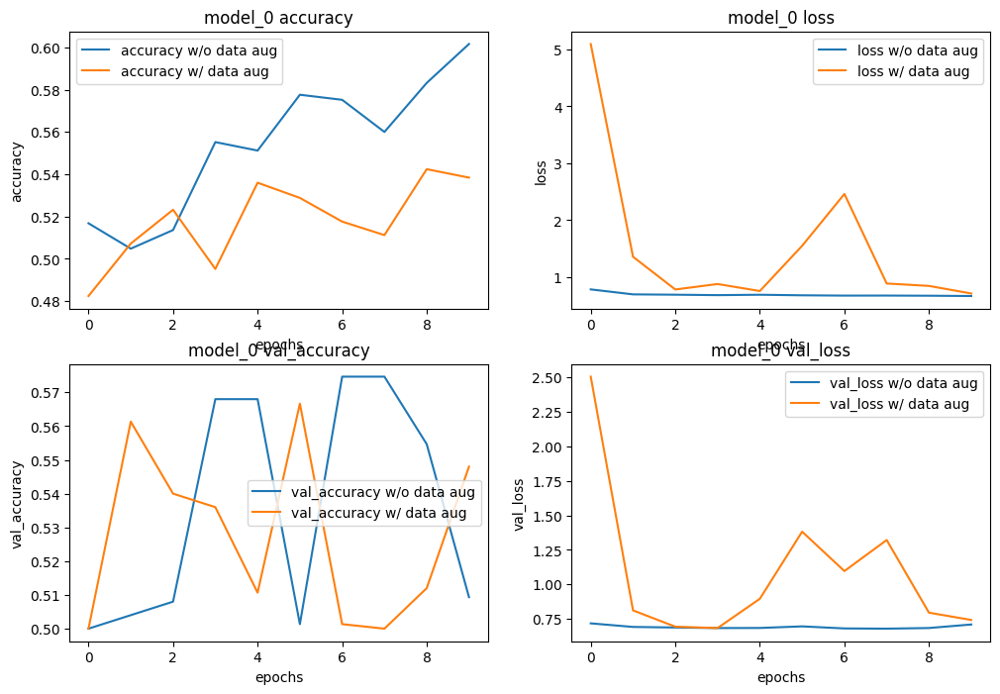

In [ ]:
compare_model_performence(history_0.history, history_0_copy.history, 'model_0')

hmmm It seems that `model_0` accuracy is wrost on the augmented data....Let's try the other models.

In [ ]:
model_0_1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (Flatten)       (None, 150528)            0         
                                                                 
 dense_3 (Dense)             (None, 100)               15052900  
                                                                 
 dense_4 (Dense)             (None, 100)               10100     
                                                                 
 dense_5 (Dense)             (None, 100)               10100     
                                                                 
 dense_6 (Dense)             (None, 50)                5050      
                                                                 
 dense_7 (Dense)             (None, 50)                2550      
                                                                 
 dense_8 (Dense)             (None, 50)               

In [ ]:
model_0_1_copy = clone_model(model_0_1)


# compile the cloned model
model_0_1_copy.compile(loss=losses.BinaryCrossentropy(),
                     optimizer=optimizers.Adam(),
                     metrics=['accuracy'])

# fit the model
history_0_1_copy = model_0_1_copy.fit(image_data_gen_10_percent_aug,
                 steps_per_epoch=len(image_data_gen_10_percent_aug),
                 validation_data=image_data_gen_10_percent_val,
                 validation_steps=len(image_data_gen_10_percent_val),
                 epochs=10)

Epoch 1/10
40/40 [==============================] - 23s 466ms/step - loss: 1.4325 - accuracy: 0.4984 - val_loss: 0.7824 - val_accuracy: 0.5013
Epoch 2/10
40/40 [==============================] - 21s 517ms/step - loss: 0.9052 - accuracy: 0.5136 - val_loss: 0.7692 - val_accuracy: 0.5187
Epoch 3/10
40/40 [==============================] - 18s 462ms/step - loss: 0.8562 - accuracy: 0.5248 - val_loss: 0.6993 - val_accuracy: 0.5747
Epoch 4/10
40/40 [==============================] - 19s 486ms/step - loss: 0.7386 - accuracy: 0.5496 - val_loss: 0.7070 - val_accuracy: 0.5253
Epoch 5/10
40/40 [==============================] - 20s 491ms/step - loss: 0.7179 - accuracy: 0.5144 - val_loss: 0.7067 - val_accuracy: 0.5347
Epoch 6/10
40/40 [==============================] - 18s 452ms/step - loss: 0.7170 - accuracy: 0.5120 - val_loss: 0.7065 - val_accuracy: 0.5040
Epoch 7/10
40/40 [==============================] - 19s 481ms/step - loss: 0.7314 - accuracy: 0.5408 - val_loss: 0.7036 - val_accuracy: 0.5293

In [ ]:
model_0_1_copy_accuracy = model_0_1_copy.evaluate(image_data_gen_10_percent_test)
model_0_1_copy_accuracy

16/16 [==============================] - 1s 70ms/step - loss: 0.8636 - accuracy: 0.5080


[0.8636270761489868, 0.5080000162124634]

In [ ]:
model_0_1_accuracy

[0.6793586611747742, 0.578000009059906]

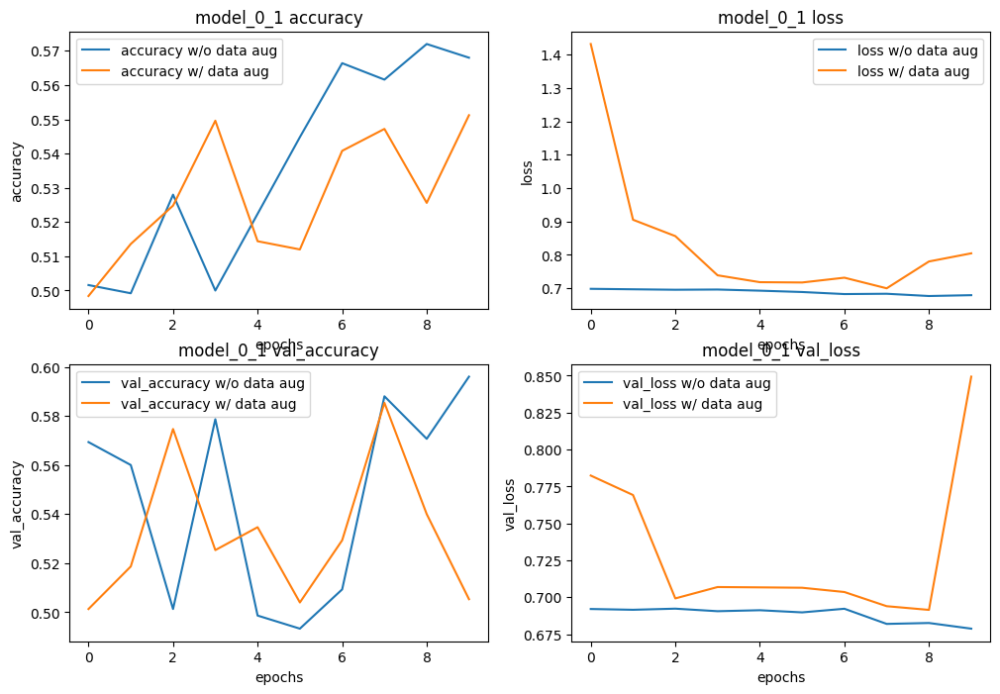

In [ ]:
compare_model_performence(history_0_1.history, history_0_1_copy.history, 'model_0_1')

In [ ]:
model_0_2_copy = clone_model(model_0_2)


# compile the cloned model
model_0_2_copy.compile(loss=losses.BinaryCrossentropy(),
                     optimizer=optimizers.Adam(),
                     metrics=['accuracy'])

# fit the model
history_0_2_copy = model_0_2_copy.fit(image_data_gen_10_percent_aug,
                 steps_per_epoch=len(image_data_gen_10_percent_aug),
                 validation_data=image_data_gen_10_percent_val,
                 validation_steps=len(image_data_gen_10_percent_val),
                 epochs=10)

Epoch 1/10
40/40 [==============================] - 20s 459ms/step - loss: 2.1222 - accuracy: 0.4872 - val_loss: 0.8233 - val_accuracy: 0.5347
Epoch 2/10
40/40 [==============================] - 20s 491ms/step - loss: 0.8830 - accuracy: 0.4928 - val_loss: 1.3375 - val_accuracy: 0.4973
Epoch 3/10
40/40 [==============================] - 20s 500ms/step - loss: 0.8157 - accuracy: 0.5296 - val_loss: 1.0358 - val_accuracy: 0.5000
Epoch 4/10
40/40 [==============================] - 19s 469ms/step - loss: 1.0894 - accuracy: 0.5144 - val_loss: 0.7436 - val_accuracy: 0.5747
Epoch 5/10
40/40 [==============================] - 21s 512ms/step - loss: 0.8152 - accuracy: 0.5368 - val_loss: 0.7293 - val_accuracy: 0.5080
Epoch 6/10
40/40 [==============================] - 21s 520ms/step - loss: 0.8238 - accuracy: 0.5376 - val_loss: 0.6782 - val_accuracy: 0.5880
Epoch 7/10
40/40 [==============================] - 21s 519ms/step - loss: 0.7378 - accuracy: 0.5592 - val_loss: 0.8382 - val_accuracy: 0.5000

In [ ]:
model_0_2_copy_accuracy = model_0_2_copy.evaluate(image_data_gen_10_percent_test)
model_0_2_copy_accuracy

16/16 [==============================] - 1s 66ms/step - loss: 0.6912 - accuracy: 0.4960


[0.6911954879760742, 0.4959999918937683]

In [ ]:
model_0_2_accuracy

[0.7301456332206726, 0.5759999752044678]

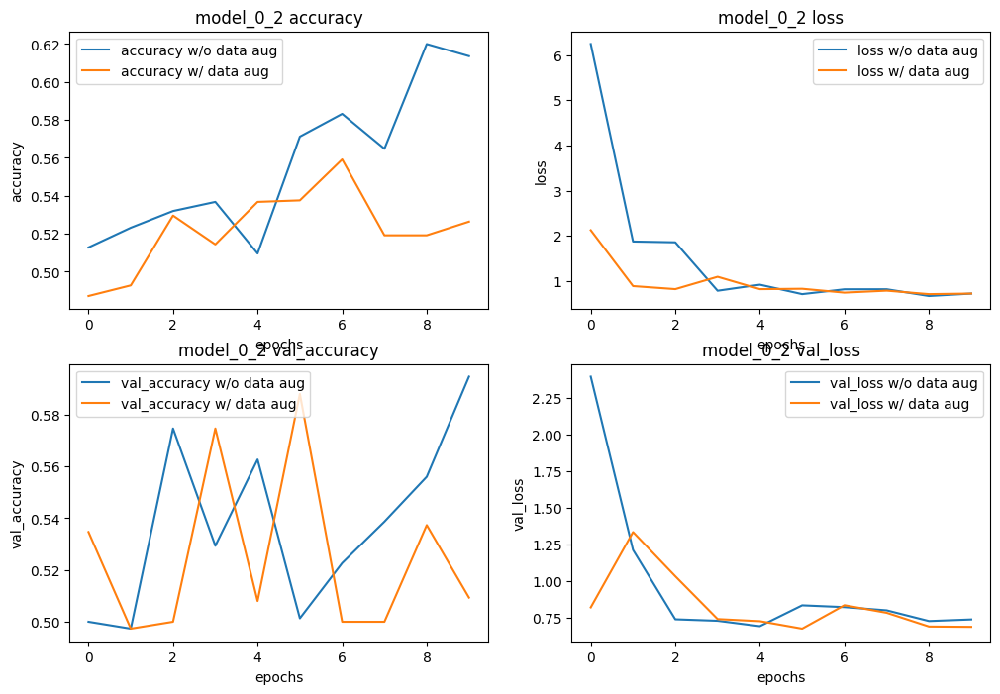

In [ ]:
compare_model_performence(history_0_2.history, history_0_2_copy.history, 'model_0_2')

Same here... It seems that `model_0_1` is performing better on non augmented data..

#### Model 1 (CNN) with augmented data

In [ ]:
model_1.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 10)      280       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 conv2d_2 (Conv2D)           (None, 218, 218, 10)      910       
                                                                 
 conv2d_3 (Conv2D)           (None, 216, 216, 10)      910       
                                                                 
 flatten (Flatten)           (None, 466560)            0         
                                                                 
 dense_13 (Dense)            (None, 1)                 466561    
                                                                 
Total params: 469,571
Trainable params: 469,571
Non-tr

In [ ]:
model_1_copy = clone_model(model_1)
model_1_copy.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 10)      280       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 conv2d_2 (Conv2D)           (None, 218, 218, 10)      910       
                                                                 
 conv2d_3 (Conv2D)           (None, 216, 216, 10)      910       
                                                                 
 flatten (Flatten)           (None, 466560)            0         
                                                                 
 dense_13 (Dense)            (None, 1)                 466561    
                                                                 
Total params: 469,571
Trainable params: 469,571
Non-tr

In [ ]:
# recompile the model
model_1_copy.compile(loss=losses.BinaryCrossentropy(),
                optimizer=optimizers.Adam(),
                metrics=["accuracy"])
# fit the model
history_1_copy = model_1_copy.fit(image_data_gen_10_percent_aug,
              validation_data=image_data_gen_10_percent_val,
                  steps_per_epoch=len(image_data_gen_10_percent_aug),
                  validation_steps=len(image_data_gen_10_percent_val),
                  epochs=10)

Epoch 1/10
40/40 [==============================] - 23s 518ms/step - loss: 0.7400 - accuracy: 0.5336 - val_loss: 0.6890 - val_accuracy: 0.5240
Epoch 2/10
40/40 [==============================] - 21s 535ms/step - loss: 0.6893 - accuracy: 0.5568 - val_loss: 0.6841 - val_accuracy: 0.6120
Epoch 3/10
40/40 [==============================] - 20s 492ms/step - loss: 0.6816 - accuracy: 0.5520 - val_loss: 0.6618 - val_accuracy: 0.5800
Epoch 4/10
40/40 [==============================] - 20s 508ms/step - loss: 0.6745 - accuracy: 0.5760 - val_loss: 0.6463 - val_accuracy: 0.6280
Epoch 5/10
40/40 [==============================] - 22s 547ms/step - loss: 0.6523 - accuracy: 0.5752 - val_loss: 0.6361 - val_accuracy: 0.6267
Epoch 6/10
40/40 [==============================] - 20s 489ms/step - loss: 0.6489 - accuracy: 0.6096 - val_loss: 0.6328 - val_accuracy: 0.6080
Epoch 7/10
40/40 [==============================] - 22s 539ms/step - loss: 0.6537 - accuracy: 0.5976 - val_loss: 0.6478 - val_accuracy: 0.6307

In [ ]:
model_1_copy_accuracy = model_1_copy.evaluate(image_data_gen_10_percent_test)
model_1_copy_accuracy, model_1_accuracy

16/16 [==============================] - 1s 70ms/step - loss: 0.8266 - accuracy: 0.5580


([0.8265737295150757, 0.5580000281333923],
 [3.1216444969177246, 0.5640000104904175])

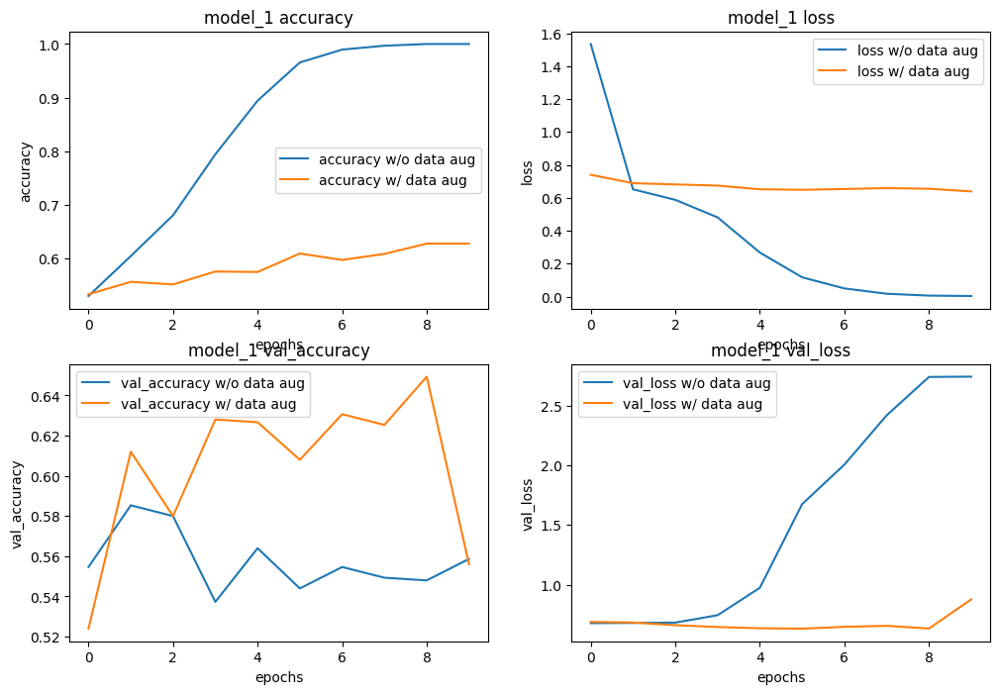

In [ ]:
compare_model_performence(history_1.history, history_1_copy.history, 'model_1')

In [ ]:
model_1_1.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 conv2d_5 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 conv2d_6 (Conv2D)           (None, 218, 218, 10)      910       
                                                                 
 flatten_1 (Flatten)         (None, 475240)            0         
                                                                 
 dense_14 (Dense)            (None, 1)                 475241    
                                                                 
Total params: 477,341
Trainable params: 477,341
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_1_1_copy = clone_model(model_1_1)
model_1_1_copy.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 conv2d_5 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 conv2d_6 (Conv2D)           (None, 218, 218, 10)      910       
                                                                 
 flatten_1 (Flatten)         (None, 475240)            0         
                                                                 
 dense_14 (Dense)            (None, 1)                 475241    
                                                                 
Total params: 477,341
Trainable params: 477,341
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_1_1_copy.compile(loss=losses.BinaryCrossentropy(),
                       optimizer=optimizers.Adam(),
                       metrics=["accuracy"])

history_1_1_copy = model_1_1_copy.fit(image_data_gen_10_percent_aug,
                   validation_data=image_data_gen_10_percent_val,
                   validation_steps=len(image_data_gen_10_percent_val),
                   steps_per_epoch=len(image_data_gen_10_percent_aug),
                   epochs=10)


Epoch 1/10
40/40 [==============================] - 24s 555ms/step - loss: 1.0717 - accuracy: 0.5056 - val_loss: 0.6831 - val_accuracy: 0.5773
Epoch 2/10
40/40 [==============================] - 19s 487ms/step - loss: 0.6839 - accuracy: 0.5792 - val_loss: 0.6804 - val_accuracy: 0.5733
Epoch 3/10
40/40 [==============================] - 21s 539ms/step - loss: 0.6716 - accuracy: 0.5808 - val_loss: 0.6835 - val_accuracy: 0.5867
Epoch 4/10
40/40 [==============================] - 19s 473ms/step - loss: 0.6627 - accuracy: 0.6032 - val_loss: 0.6774 - val_accuracy: 0.5707
Epoch 5/10
40/40 [==============================] - 19s 476ms/step - loss: 0.6565 - accuracy: 0.6024 - val_loss: 0.7118 - val_accuracy: 0.5307
Epoch 6/10
40/40 [==============================] - 21s 520ms/step - loss: 0.6558 - accuracy: 0.6192 - val_loss: 0.6787 - val_accuracy: 0.6107
Epoch 7/10
40/40 [==============================] - 22s 563ms/step - loss: 0.6630 - accuracy: 0.5952 - val_loss: 0.6802 - val_accuracy: 0.5960

In [ ]:
model_1_1_copy_accuracy = model_1_1_copy.evaluate(image_data_gen_10_percent_test)
model_1_1_copy_accuracy, model_1_1_accuracy

16/16 [==============================] - 1s 83ms/step - loss: 0.6624 - accuracy: 0.5840


([0.6624261736869812, 0.5839999914169312],
 [1.5529686212539673, 0.6140000224113464])

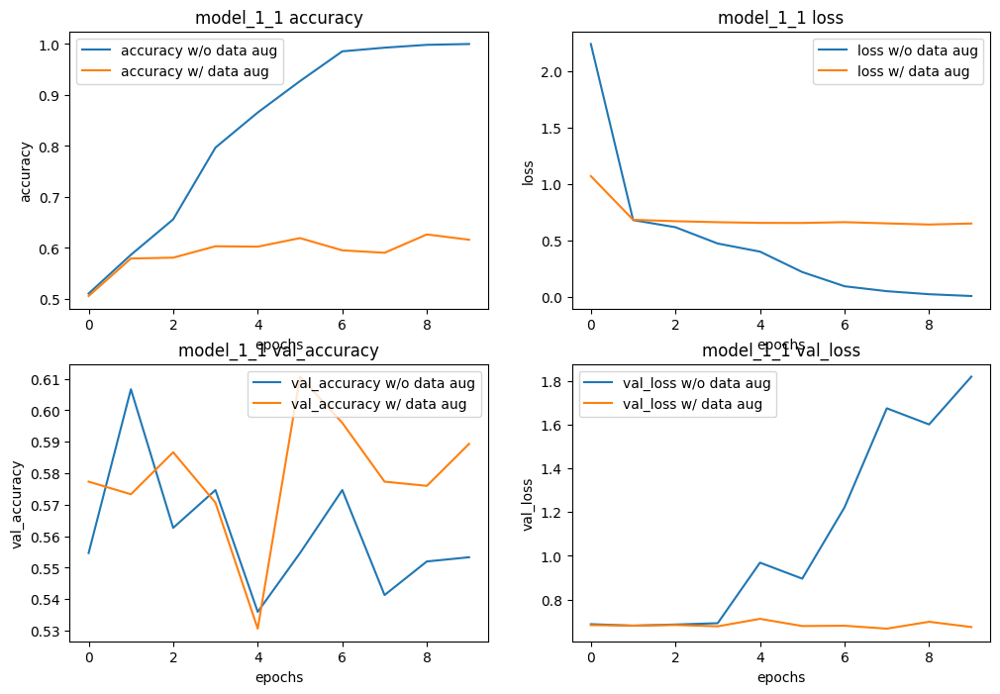

In [ ]:
compare_model_performence(history_1_1.history, history_1_1_copy.history, 'model_1_1')

Yeah at least some improvements. The `model_1_1` accuracy which is trained on augmented data is more than higher the one who was trained on non augmented data. It worth to precise that since we do not have enough data, even when with data augmentation the outcome might not be very different. But when we take a look at the model, when trained on non augmented data, it was overfitting. By applying data augmentation we got rid of that. Indeed data augmentation is a way to reduce overfitting.

In [ ]:
model_1_2.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 conv2d_8 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 10)     0         
 )                                                               
                                                                 
 conv2d_9 (Conv2D)           (None, 108, 108, 10)      910       
                                                                 
 conv2d_10 (Conv2D)          (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 53, 53, 10)       0         
 2D)                                                  

In [ ]:
model_1_2_copy = clone_model(model_1_2)
model_1_2.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 conv2d_8 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 10)     0         
 )                                                               
                                                                 
 conv2d_9 (Conv2D)           (None, 108, 108, 10)      910       
                                                                 
 conv2d_10 (Conv2D)          (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 53, 53, 10)       0         
 2D)                                                  

In [ ]:
# compile and fit the model
model_1_2_copy.compile(loss=losses.BinaryCrossentropy(),
                       optimizer=optimizers.Adam(),
                       metrics=["accuracy"])

history_1_2_copy = model_1_2_copy.fit(image_data_gen_10_percent_aug,
                                      validation_data=image_data_gen_10_percent_val,
                                      validation_steps=len(image_data_gen_10_percent_val),
                                      steps_per_epoch=len(image_data_gen_10_percent_aug),
                                      epochs=10)

Epoch 1/10
40/40 [==============================] - 21s 469ms/step - loss: 7.4852 - accuracy: 0.4968 - val_loss: 7.6246 - val_accuracy: 0.5000
Epoch 2/10
40/40 [==============================] - 21s 518ms/step - loss: 7.6246 - accuracy: 0.5000 - val_loss: 7.6246 - val_accuracy: 0.5000
Epoch 3/10
40/40 [==============================] - 21s 531ms/step - loss: 7.6246 - accuracy: 0.5000 - val_loss: 7.6246 - val_accuracy: 0.5000
Epoch 4/10
40/40 [==============================] - 20s 497ms/step - loss: 7.6246 - accuracy: 0.5000 - val_loss: 7.6246 - val_accuracy: 0.5000
Epoch 5/10
40/40 [==============================] - 20s 502ms/step - loss: 7.6246 - accuracy: 0.5000 - val_loss: 7.6246 - val_accuracy: 0.5000
Epoch 6/10
40/40 [==============================] - 20s 483ms/step - loss: 7.6246 - accuracy: 0.5000 - val_loss: 7.6246 - val_accuracy: 0.5000
Epoch 7/10
40/40 [==============================] - 19s 467ms/step - loss: 7.6246 - accuracy: 0.5000 - val_loss: 7.6246 - val_accuracy: 0.5000

In [ ]:
model_1_2_copy_accuracy = model_1_2_copy.evaluate(image_data_gen_10_percent_test)
model_1_2_copy_accuracy, model_1_2_accuracy

16/16 [==============================] - 1s 65ms/step - loss: 7.6246 - accuracy: 0.5000


([7.624619007110596, 0.5], [2.405611515045166, 0.6480000019073486])

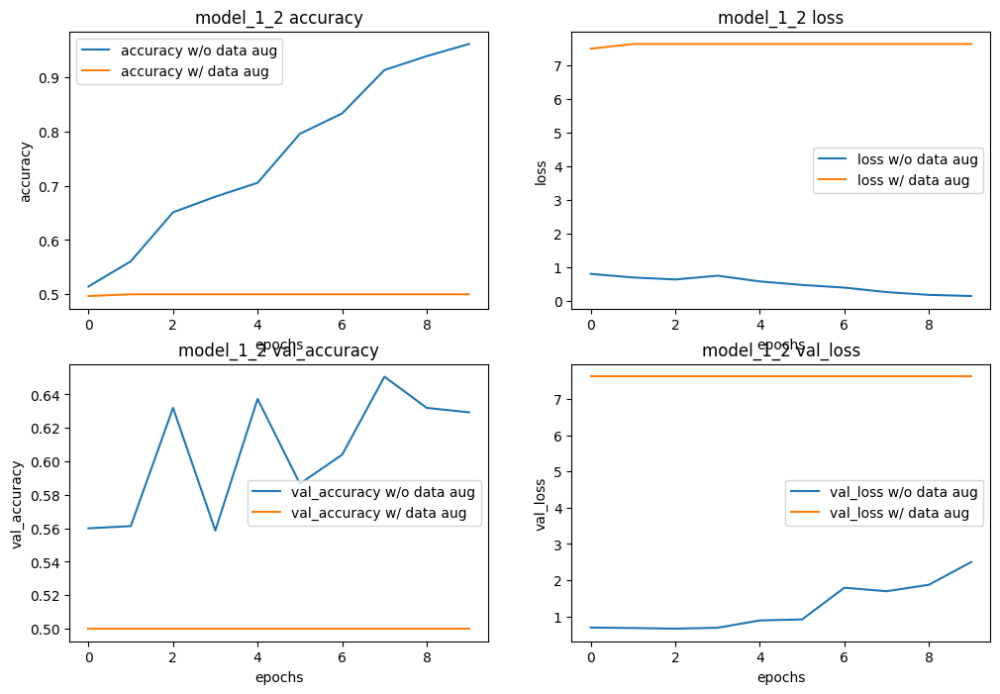

In [ ]:
compare_model_performence(history_1_2.history, history_1_2_copy.history, 'model_1_2')

Hum... It seams that our model can't capture any relevent information and act like it was guessing. We also used the maxpooling 2d to capture the more important informations but it seams that it can't.

Now Let's use our best performing model so far and see how it performs on augemented data

In [ ]:
model_1_3.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_11 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 111, 111, 32)     0         
 2D)                                                             
                                                                 
 conv2d_12 (Conv2D)          (None, 109, 109, 32)      9248      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 54, 54, 32)       0         
 2D)                                                             
                                                                 
 conv2d_13 (Conv2D)          (None, 52, 52, 32)        9248      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 26, 26, 32)      

In [ ]:
model_1_3_copy = clone_model(model_1_3)
model_1_3_copy.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_11 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 111, 111, 32)     0         
 2D)                                                             
                                                                 
 conv2d_12 (Conv2D)          (None, 109, 109, 32)      9248      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 54, 54, 32)       0         
 2D)                                                             
                                                                 
 conv2d_13 (Conv2D)          (None, 52, 52, 32)        9248      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 26, 26, 32)      

In [ ]:
model_1_3_copy.compile(loss=losses.BinaryCrossentropy(),
                  optimizer=optimizers.Adam(),
                  metrics=["accuracy"])

history_1_3_copy = model_1_3_copy.fit(image_data_gen_10_percent_aug,
                                      validation_data=image_data_gen_10_percent_val,
                                      validation_steps=len(image_data_gen_10_percent_val),
                                      steps_per_epoch=len(image_data_gen_10_percent_aug),
                                      epochs=10)

Epoch 1/10
40/40 [==============================] - 21s 465ms/step - loss: 0.6958 - accuracy: 0.4944 - val_loss: 0.6914 - val_accuracy: 0.5013
Epoch 2/10
40/40 [==============================] - 22s 551ms/step - loss: 0.6931 - accuracy: 0.5016 - val_loss: 0.6921 - val_accuracy: 0.5960
Epoch 3/10
40/40 [==============================] - 20s 488ms/step - loss: 0.6923 - accuracy: 0.5352 - val_loss: 0.6888 - val_accuracy: 0.4987
Epoch 4/10
40/40 [==============================] - 19s 466ms/step - loss: 0.6927 - accuracy: 0.5152 - val_loss: 0.6922 - val_accuracy: 0.5013
Epoch 5/10
40/40 [==============================] - 21s 520ms/step - loss: 0.6919 - accuracy: 0.5312 - val_loss: 0.6844 - val_accuracy: 0.5320
Epoch 6/10
40/40 [==============================] - 19s 473ms/step - loss: 0.6845 - accuracy: 0.5440 - val_loss: 0.6905 - val_accuracy: 0.5160
Epoch 7/10
40/40 [==============================] - 20s 497ms/step - loss: 0.6865 - accuracy: 0.5584 - val_loss: 0.6936 - val_accuracy: 0.5493

In [ ]:
model_1_3_copy_accuracy = model_1_3_copy.evaluate(image_data_gen_10_percent_test)
model_1_3_copy_accuracy, model_1_3_accuracy

16/16 [==============================] - 2s 95ms/step - loss: 0.6746 - accuracy: 0.5580


([0.6745533347129822, 0.5580000281333923],
 [0.5830241441726685, 0.6899999976158142])

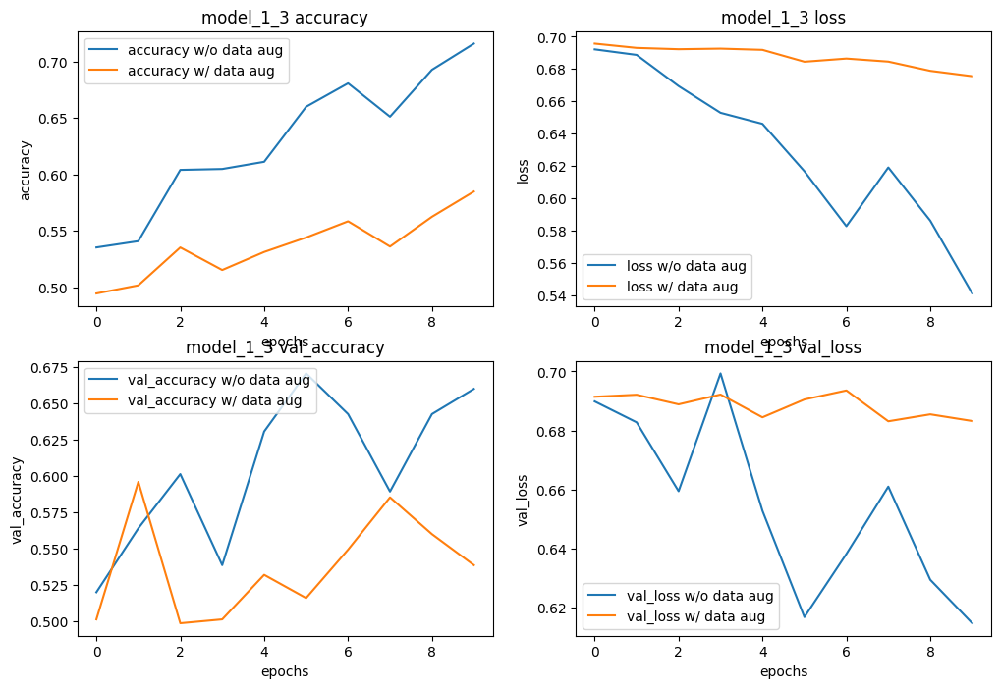

In [ ]:
compare_model_performence(history_1_3.history, history_1_3_copy.history, 'model_1_3')

We can observe that  `model_1_3` performing better on non augmented data than on augmented data

#### Can data augementation reduce the performence of a model when the data is not enough ?


Yes, data augmentation can potentially make the model worse in accuracy when the data is not enough for training. Data augmentation is a technique commonly used in deep learning to artificially increase the size of the training dataset by applying various transformations to the existing data, such as rotation, flipping, zooming, or adding noise.

The main goal of data augmentation is to improve the generalization ability of the model by exposing it to a wider variety of data samples. This helps the model learn more robust features and patterns that are invariant to these transformations, making it more capable of handling variations in real-world data.

However, data augmentation is not a panacea. If the original dataset is already limited, and data augmentation is applied excessively or inappropriately, it can lead to overfitting. Overfitting occurs when the model becomes too specialized in the training data and fails to generalize well to unseen data. Data augmentation can exacerbate this problem because it introduces additional variations that might not be representative of the underlying patterns in the true data distribution.

If the training dataset is small and data augmentation is not controlled properly, the model might start to memorize the augmented samples, leading to poor performance on the validation or test data. The key to using data augmentation effectively is to strike the right balance between introducing useful variations and avoiding overfitting.

### 5. Use the full data non augmented and repeat step 1 to 3

Now that we're done with experimentation on the 10% of the data. Let's ue the full dataset on the model and see if they can perform better. First of all we are going to use all the data without data augmentation.

In [ ]:
train_dir, test_dir

('cats_dogs/train', 'cats_dogs/test')

In [ ]:
# turn data into batches

from tensorflow.keras.preprocessing.image import ImageDataGenerator

image_data_gen = ImageDataGenerator(rescale=1./255)

train_data = image_data_gen.flow_from_directory(directory=train_dir,
                                                target_size=IMG_SHAPE,
                                                batch_size=BATCH_SIZE,
                                                class_mode='binary',
                                                seed=42)

val_data = image_data_gen.flow_from_directory(directory=val_dir,
                                                target_size=IMG_SHAPE,
                                                batch_size=BATCH_SIZE,
                                                class_mode='binary',
                                                seed=42)

test_data = image_data_gen.flow_from_directory(directory=test_dir,
                                                target_size=IMG_SHAPE,
                                                batch_size=BATCH_SIZE,
                                                class_mode='binary',
                                                seed=42)

Found 12500 images belonging to 2 classes.
Found 7500 images belonging to 2 classes.
Found 5000 images belonging to 2 classes.


In [ ]:
# how many batches do we have in train
len(train_data)

391

In [ ]:
# take one batch (of 32) in train_data
images, labels = train_data.next()

In [ ]:
images.shape

(32, 224, 224, 3)

(-0.5, 223.5, 223.5, -0.5)

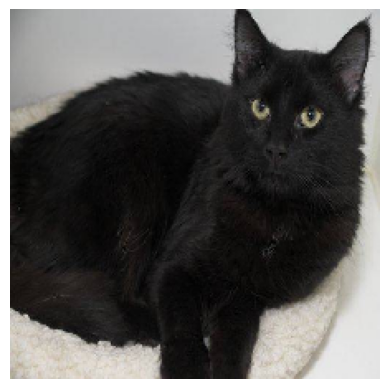

In [ ]:
plt.imshow(images[random.randint(0, 31)])
plt.axis(False)

Now we turnd our data into bacthes, let's fit it to some models. We are still going to use the models we built earlier and compare the results

#### Model 0 (baseline) on full data non augmented

In [ ]:
model_0_full = clone_model(model_0)
model_0.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (Flatten)       (None, 150528)            0         
                                                                 
 dense (Dense)               (None, 100)               15052900  
                                                                 
 dense_1 (Dense)             (None, 100)               10100     
                                                                 
 dense_2 (Dense)             (None, 100)               10100     
                                                                 
 output_layer (Dense)        (None, 1)                 101       
                                                                 
Total params: 15,073,201
Trainable params: 15,073,201
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# load and fit the model

model_0_full.compile(loss=losses.BinaryCrossentropy(),
            optimizer=optimizers.Adam(),
            metrics=['accuracy'])

history_0_full = model_0_full.fit(train_data,
                                  validation_data=val_data,
                                  steps_per_epoch=len(train_data),
                                  validation_steps=len(val_data),
                                  epochs=10)

Epoch 1/10
391/391 [==============================] - 50s 125ms/step - loss: 1.2237 - accuracy: 0.5310 - val_loss: 0.6701 - val_accuracy: 0.5860
Epoch 2/10
391/391 [==============================] - 45s 116ms/step - loss: 0.7530 - accuracy: 0.5406 - val_loss: 0.7199 - val_accuracy: 0.5481
Epoch 3/10
391/391 [==============================] - 50s 127ms/step - loss: 0.7026 - accuracy: 0.5191 - val_loss: 0.6905 - val_accuracy: 0.5193
Epoch 4/10
391/391 [==============================] - 48s 122ms/step - loss: 0.6918 - accuracy: 0.5112 - val_loss: 0.6931 - val_accuracy: 0.5011
Epoch 5/10
391/391 [==============================] - 47s 120ms/step - loss: 0.6932 - accuracy: 0.4922 - val_loss: 0.6932 - val_accuracy: 0.5001
Epoch 6/10
391/391 [==============================] - 45s 115ms/step - loss: 0.6932 - accuracy: 0.4991 - val_loss: 0.6932 - val_accuracy: 0.5003
Epoch 7/10
391/391 [==============================] - 50s 127ms/step - loss: 0.6932 - accuracy: 0.4940 - val_loss: 0.6930 - val_ac

In [ ]:
model_0_full_accuracy = model_0_full.evaluate(test_data)
model_0_full_accuracy, model_0_accuracy, model_0_copy_accuracy

157/157 [==============================] - 12s 74ms/step - loss: 0.6931 - accuracy: 0.5004


([0.6931440830230713, 0.5004000067710876],
 [0.7150483131408691, 0.5440000295639038],
 [0.7583543658256531, 0.5440000295639038])

Looks like `model_0` is still performing poorly despite being fited on the full dataset. Let's tru the others model

In [ ]:
model_0_1_full = clone_model(model_0_1)
model_0_1_full.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (Flatten)       (None, 150528)            0         
                                                                 
 dense_3 (Dense)             (None, 100)               15052900  
                                                                 
 dense_4 (Dense)             (None, 100)               10100     
                                                                 
 dense_5 (Dense)             (None, 100)               10100     
                                                                 
 dense_6 (Dense)             (None, 50)                5050      
                                                                 
 dense_7 (Dense)             (None, 50)                2550      
                                                                 
 dense_8 (Dense)             (None, 50)               

In [ ]:
# load and fit the model

model_0_1_full.compile(loss=losses.BinaryCrossentropy(),
            optimizer=optimizers.Adam(),
            metrics=['accuracy'])

history_0_1_full = model_0_1_full.fit(train_data,
                                  validation_data=val_data,
                                  steps_per_epoch=len(train_data),
                                  validation_steps=len(val_data),
                                  epochs=10)

Epoch 1/10
391/391 [==============================] - 53s 129ms/step - loss: 0.7997 - accuracy: 0.5236 - val_loss: 0.6825 - val_accuracy: 0.5557
Epoch 2/10
391/391 [==============================] - 44s 113ms/step - loss: 0.6824 - accuracy: 0.5735 - val_loss: 0.6968 - val_accuracy: 0.5441
Epoch 3/10
391/391 [==============================] - 54s 137ms/step - loss: 0.6843 - accuracy: 0.5630 - val_loss: 0.6799 - val_accuracy: 0.5416
Epoch 4/10
391/391 [==============================] - 46s 118ms/step - loss: 0.6713 - accuracy: 0.5878 - val_loss: 0.6705 - val_accuracy: 0.5916
Epoch 5/10
391/391 [==============================] - 47s 119ms/step - loss: 0.6662 - accuracy: 0.6029 - val_loss: 0.6641 - val_accuracy: 0.6124
Epoch 6/10
391/391 [==============================] - 44s 113ms/step - loss: 0.6628 - accuracy: 0.6150 - val_loss: 0.6612 - val_accuracy: 0.6080
Epoch 7/10
391/391 [==============================] - 52s 133ms/step - loss: 0.6628 - accuracy: 0.6062 - val_loss: 0.6600 - val_ac

In [ ]:
model_0_1_full_accuracy = model_0_1_full.evaluate(test_data)
model_0_1_full_accuracy, model_0_1_accuracy, model_0_1_copy_accuracy

157/157 [==============================] - 12s 74ms/step - loss: 0.6845 - accuracy: 0.5628


([0.6844741702079773, 0.5627999901771545],
 [0.6793586611747742, 0.578000009059906],
 [0.8636270761489868, 0.5080000162124634])

Without surprise we got the same result here...

In [ ]:
model_0_2_full = clone_model(model_0_2)
model_0_2_full.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (Flatten)       (None, 150528)            0         
                                                                 
 dense_9 (Dense)             (None, 100)               15052900  
                                                                 
 dense_10 (Dense)            (None, 100)               10100     
                                                                 
 dense_11 (Dense)            (None, 50)                5050      
                                                                 
 dense_12 (Dense)            (None, 50)                2550      
                                                                 
 output_layer (Dense)        (None, 1)                 51        
                                                                 
Total params: 15,070,651
Trainable params: 15,070,651


In [ ]:
# load and fit the model

model_0_2_full.compile(loss=losses.BinaryCrossentropy(),
            optimizer=optimizers.Adam(),
            metrics=['accuracy'])

history_0_2_full = model_0_2_full.fit(train_data,
                                  validation_data=val_data,
                                  steps_per_epoch=len(train_data),
                                  validation_steps=len(val_data),
                                  epochs=10)

Epoch 1/10
391/391 [==============================] - 55s 135ms/step - loss: 0.9567 - accuracy: 0.5340 - val_loss: 0.7620 - val_accuracy: 0.5051
Epoch 2/10
391/391 [==============================] - 47s 120ms/step - loss: 0.7294 - accuracy: 0.5497 - val_loss: 0.6591 - val_accuracy: 0.6032
Epoch 3/10
391/391 [==============================] - 49s 126ms/step - loss: 0.6807 - accuracy: 0.5842 - val_loss: 0.6688 - val_accuracy: 0.5901
Epoch 4/10
391/391 [==============================] - 46s 118ms/step - loss: 0.6751 - accuracy: 0.5913 - val_loss: 0.6602 - val_accuracy: 0.5956
Epoch 5/10
391/391 [==============================] - 50s 128ms/step - loss: 0.6693 - accuracy: 0.6002 - val_loss: 0.6550 - val_accuracy: 0.6119
Epoch 6/10
391/391 [==============================] - 47s 119ms/step - loss: 0.6679 - accuracy: 0.5998 - val_loss: 0.6623 - val_accuracy: 0.6000
Epoch 7/10
391/391 [==============================] - 47s 121ms/step - loss: 0.6559 - accuracy: 0.6118 - val_loss: 0.6532 - val_ac

In [ ]:
model_0_2_full_accuracy = model_0_2_full.evaluate(test_data)
model_0_2_full_accuracy, model_0_2_accuracy, model_0_2_copy_accuracy

157/157 [==============================] - 12s 77ms/step - loss: 0.6541 - accuracy: 0.5934


([0.6541144847869873, 0.5934000015258789],
 [0.7301456332206726, 0.5759999752044678],
 [0.6911954879760742, 0.4959999918937683])

The model `model_1_2` which is a simplified version (removed 2 layers) of the `model_1_1` has the best performence. It even beat the same model that was trained on 10 percent of the augmented data. The `model_0_2` has an average accuracy (mean of all its accuracy on the 3 different data) of 57%, the `model_0_1` has an accuracy of 51% and `model_0` has an accuracy of 54%

Let's try to beat the performence of `model_0_2` trained on the full data non augmented

#### Model 1 (CNN) on full data non augmented

In [ ]:
model_1_full = clone_model(model_1)
model_1_full.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 10)      280       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 conv2d_2 (Conv2D)           (None, 218, 218, 10)      910       
                                                                 
 conv2d_3 (Conv2D)           (None, 216, 216, 10)      910       
                                                                 
 flatten (Flatten)           (None, 466560)            0         
                                                                 
 dense_13 (Dense)            (None, 1)                 466561    
                                                                 
Total params: 469,571
Trainable params: 469,571
Non-tr

In [ ]:
# load and fit the model

model_1_full.compile(loss=losses.BinaryCrossentropy(),
            optimizer=optimizers.Adam(),
            metrics=['accuracy'])

history_1_full = model_1_full.fit(train_data,
                                  validation_data=val_data,
                                  steps_per_epoch=len(train_data),
                                  validation_steps=len(val_data),
                                  epochs=10)

Epoch 1/10
391/391 [==============================] - 54s 133ms/step - loss: 0.7003 - accuracy: 0.6206 - val_loss: 0.5926 - val_accuracy: 0.6951
Epoch 2/10
391/391 [==============================] - 52s 132ms/step - loss: 0.5227 - accuracy: 0.7366 - val_loss: 0.5614 - val_accuracy: 0.7087
Epoch 3/10
391/391 [==============================] - 50s 127ms/step - loss: 0.3008 - accuracy: 0.8729 - val_loss: 0.6733 - val_accuracy: 0.7023
Epoch 4/10
391/391 [==============================] - 50s 127ms/step - loss: 0.0822 - accuracy: 0.9736 - val_loss: 1.1000 - val_accuracy: 0.6989
Epoch 5/10
391/391 [==============================] - 50s 128ms/step - loss: 0.0186 - accuracy: 0.9958 - val_loss: 1.4850 - val_accuracy: 0.6928
Epoch 6/10
391/391 [==============================] - 53s 136ms/step - loss: 0.0196 - accuracy: 0.9950 - val_loss: 1.4816 - val_accuracy: 0.6963
Epoch 7/10
391/391 [==============================] - 51s 131ms/step - loss: 0.0188 - accuracy: 0.9956 - val_loss: 1.5964 - val_ac

In [ ]:
model_1_full_accuracy = model_1_full.evaluate(test_data)
model_1_full_accuracy, model_1_accuracy, model_1_copy_accuracy

157/157 [==============================] - 12s 74ms/step - loss: 2.3249 - accuracy: 0.6844


([2.3248698711395264, 0.6844000220298767],
 [3.1216444969177246, 0.5640000104904175],
 [0.8265737295150757, 0.5580000281333923])

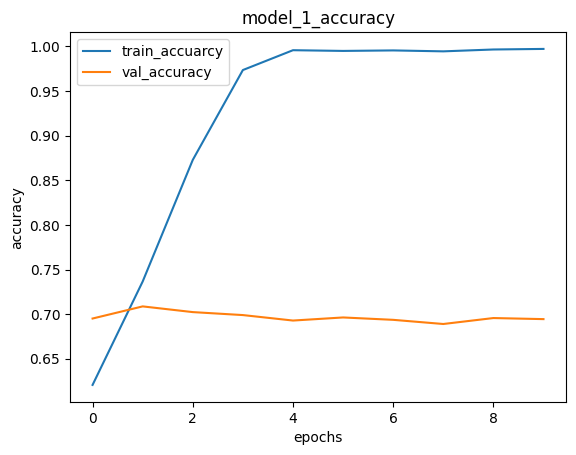

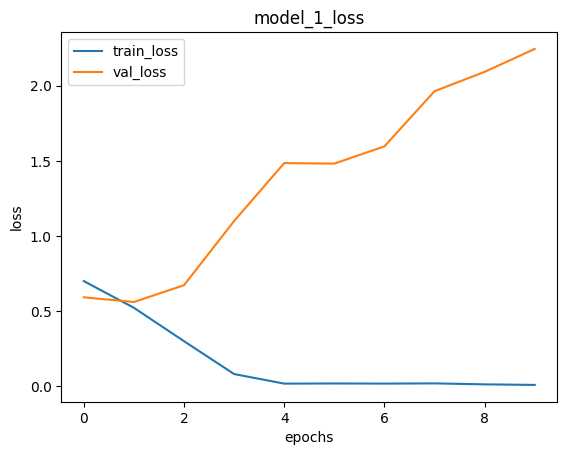

In [ ]:
plot_loss_curve(history_1_full.history, 'model_1')

It's obvious our model is overfitting but we already beat `model_0_1` with our CNN model. Also `model_1` performence on the full data  are better than
those trained on 10% w/o data augmentation.

In [ ]:
model_1_1_full = clone_model(model_1_1)
model_1_1_full.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 conv2d_5 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 conv2d_6 (Conv2D)           (None, 218, 218, 10)      910       
                                                                 
 flatten_1 (Flatten)         (None, 475240)            0         
                                                                 
 dense_14 (Dense)            (None, 1)                 475241    
                                                                 
Total params: 477,341
Trainable params: 477,341
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# load and fit the model

model_1_1_full.compile(loss=losses.BinaryCrossentropy(),
            optimizer=optimizers.Adam(),
            metrics=['accuracy'])

history_1_1_full = model_1_1_full.fit(train_data,
                                  validation_data=val_data,
                                  steps_per_epoch=len(train_data),
                                  validation_steps=len(val_data),
                                  epochs=10)

Epoch 1/10
391/391 [==============================] - 50s 123ms/step - loss: 0.6223 - accuracy: 0.6454 - val_loss: 0.5815 - val_accuracy: 0.6889
Epoch 2/10
391/391 [==============================] - 49s 124ms/step - loss: 0.4696 - accuracy: 0.7788 - val_loss: 0.5709 - val_accuracy: 0.7069
Epoch 3/10
391/391 [==============================] - 51s 131ms/step - loss: 0.2296 - accuracy: 0.9104 - val_loss: 0.7752 - val_accuracy: 0.6849
Epoch 4/10
391/391 [==============================] - 52s 133ms/step - loss: 0.0666 - accuracy: 0.9805 - val_loss: 1.2965 - val_accuracy: 0.6844
Epoch 5/10
391/391 [==============================] - 49s 126ms/step - loss: 0.0211 - accuracy: 0.9959 - val_loss: 1.5288 - val_accuracy: 0.6885
Epoch 6/10
391/391 [==============================] - 53s 137ms/step - loss: 0.0170 - accuracy: 0.9965 - val_loss: 1.6759 - val_accuracy: 0.6920
Epoch 7/10
391/391 [==============================] - 54s 138ms/step - loss: 0.0214 - accuracy: 0.9948 - val_loss: 1.6543 - val_ac

In [ ]:
model_1_1_full_accuracy = model_1_1_full.evaluate(test_data)
model_1_1_full_accuracy, model_1_1_accuracy, model_1_1_copy_accuracy

157/157 [==============================] - 12s 74ms/step - loss: 2.3295 - accuracy: 0.6854


([2.329490900039673, 0.6854000091552734],
 [1.5529686212539673, 0.6140000224113464],
 [0.6624261736869812, 0.5839999914169312])

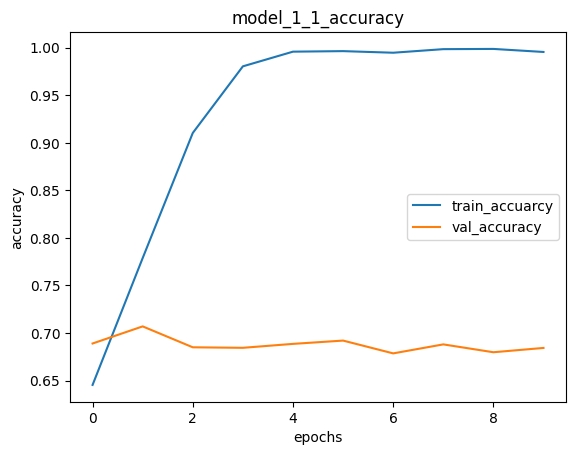

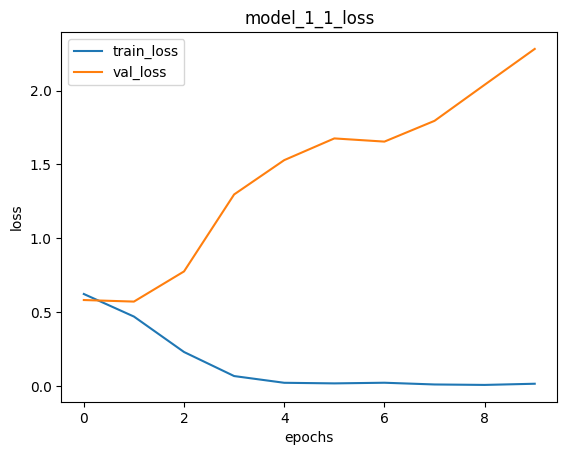

In [ ]:
plot_loss_curve(history_1_1_full.history, 'model_1_1')

Once again our model overfits, But it performs best than `model_1`

In [ ]:
model_1_2_full = clone_model(model_1_2)
model_1_2_full.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 conv2d_8 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 10)     0         
 )                                                               
                                                                 
 conv2d_9 (Conv2D)           (None, 108, 108, 10)      910       
                                                                 
 conv2d_10 (Conv2D)          (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 53, 53, 10)       0         
 2D)                                                  

In [ ]:
# load and fit the model

model_1_2_full.compile(loss=losses.BinaryCrossentropy(),
            optimizer=optimizers.Adam(),
            metrics=['accuracy'])

history_1_2_full = model_1_2_full.fit(train_data,
                                  validation_data=val_data,
                                  steps_per_epoch=len(train_data),
                                  validation_steps=len(val_data),
                                  epochs=10)

Epoch 1/10
391/391 [==============================] - 54s 132ms/step - loss: 7.6537 - accuracy: 0.5008 - val_loss: 7.7125 - val_accuracy: 0.5000
Epoch 2/10
391/391 [==============================] - 53s 135ms/step - loss: 7.7125 - accuracy: 0.5000 - val_loss: 7.7125 - val_accuracy: 0.5000
Epoch 3/10
391/391 [==============================] - 48s 123ms/step - loss: 7.7125 - accuracy: 0.5000 - val_loss: 7.7125 - val_accuracy: 0.5000
Epoch 4/10
391/391 [==============================] - 48s 123ms/step - loss: 7.7125 - accuracy: 0.5000 - val_loss: 7.7125 - val_accuracy: 0.5000
Epoch 5/10
391/391 [==============================] - 50s 129ms/step - loss: 7.7125 - accuracy: 0.5000 - val_loss: 7.7125 - val_accuracy: 0.5000
Epoch 6/10
391/391 [==============================] - 51s 130ms/step - loss: 7.7125 - accuracy: 0.5000 - val_loss: 7.7125 - val_accuracy: 0.5000
Epoch 7/10
391/391 [==============================] - 50s 128ms/step - loss: 7.7125 - accuracy: 0.5000 - val_loss: 7.7125 - val_ac

In [ ]:
model_1_2_full_accuracy = model_1_2_full.evaluate(test_data)
model_1_2_full_accuracy, model_1_2_accuracy, model_1_2_copy_accuracy

157/157 [==============================] - 11s 69ms/step - loss: 7.7125 - accuracy: 0.5000


([7.712471961975098, 0.5],
 [2.405611515045166, 0.6480000019073486],
 [7.624619007110596, 0.5])

humm, whatever data we pass to `model_1_2` it seams that it still guessing the output. The model architecture might have something to do with this...


In [ ]:
model_1_3_full = clone_model(model_1_3)
model_1_3_full.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_11 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 111, 111, 32)     0         
 2D)                                                             
                                                                 
 conv2d_12 (Conv2D)          (None, 109, 109, 32)      9248      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 54, 54, 32)       0         
 2D)                                                             
                                                                 
 conv2d_13 (Conv2D)          (None, 52, 52, 32)        9248      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 26, 26, 32)      

In [ ]:
# load and fit the model

model_1_3_full.compile(loss=losses.BinaryCrossentropy(),
            optimizer=optimizers.Adam(),
            metrics=['accuracy'])

history_1_3_full = model_1_3_full.fit(train_data,
                                  validation_data=val_data,
                                  steps_per_epoch=len(train_data),
                                  validation_steps=len(val_data),
                                  epochs=10)

Epoch 1/10
391/391 [==============================] - 55s 133ms/step - loss: 0.6510 - accuracy: 0.6018 - val_loss: 0.5891 - val_accuracy: 0.6813
Epoch 2/10
391/391 [==============================] - 48s 124ms/step - loss: 0.5344 - accuracy: 0.7367 - val_loss: 0.4999 - val_accuracy: 0.7612
Epoch 3/10
391/391 [==============================] - 54s 138ms/step - loss: 0.4682 - accuracy: 0.7831 - val_loss: 0.4755 - val_accuracy: 0.7787
Epoch 4/10
391/391 [==============================] - 56s 142ms/step - loss: 0.4261 - accuracy: 0.8058 - val_loss: 0.4567 - val_accuracy: 0.7816
Epoch 5/10
391/391 [==============================] - 49s 124ms/step - loss: 0.3852 - accuracy: 0.8324 - val_loss: 0.4384 - val_accuracy: 0.7969
Epoch 6/10
391/391 [==============================] - 48s 122ms/step - loss: 0.3461 - accuracy: 0.8478 - val_loss: 0.4110 - val_accuracy: 0.8252
Epoch 7/10
391/391 [==============================] - 52s 133ms/step - loss: 0.3056 - accuracy: 0.8727 - val_loss: 0.3888 - val_ac

In [ ]:
model_1_3_full_accuracy = model_1_3_full.evaluate(test_data)
model_1_3_full_accuracy, model_1_3_accuracy, model_1_3_copy_accuracy

157/157 [==============================] - 13s 82ms/step - loss: 0.5019 - accuracy: 0.8090


([0.5019410848617554, 0.8090000152587891],
 [0.5830241441726685, 0.6899999976158142],
 [0.6745533347129822, 0.5580000281333923])

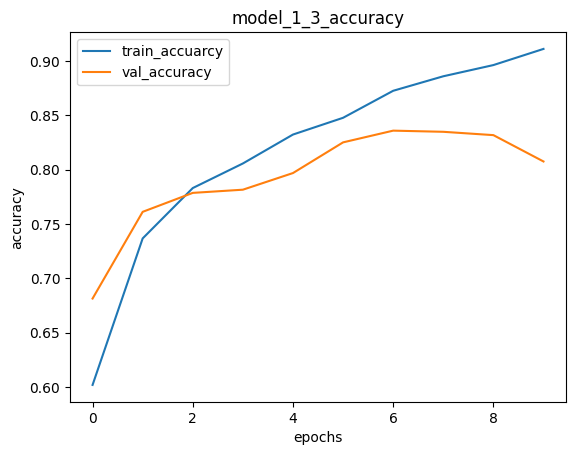

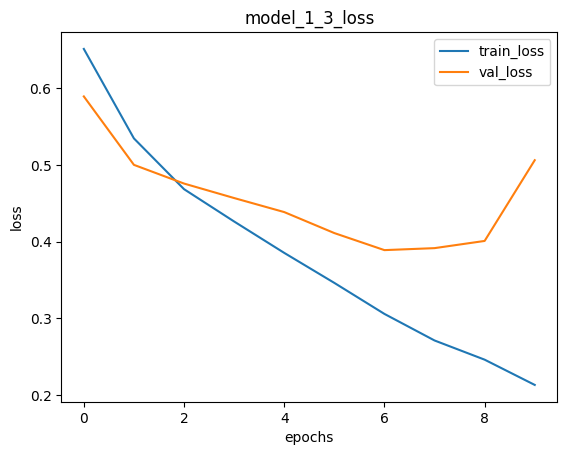

In [ ]:
plot_loss_curve(history_1_3_full.history, 'model_1_3')

This is our best model so far with an accuracy above 80 percent !!! Even this I know we can reach better results I am very happy with this performence. At a certain point in the training process the model started to overfit, so It may be time for some data augmentation.

I shoukd mention that Im going to use data augmentation on this model only for 2 reasons:
1. This is our best model, so we may expect better results with data augmentation. Therefore, we are going to save time by focusing only on this model
2. I could use data augmenttion on the other models but since the previous CNN models were either overfit(w/o augmented data) or dont capture the informations (w/o augmented data), adding data augmentation could result to the same issue (nothing will change). For the other models (fully connected) I could use data augmented to try to improve their accuracy it's unlikely that will performer better than CNN models

### 6. Use the full data augmented on our best CNN model

In [ ]:
# adding data augmentation on train data (ONLY)

image_data_gen_aug = ImageDataGenerator(rescale=1/255.,
                                    rotation_range=0.2,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    width_shift_range=0.2,
                                    height_shift_range=0.2,
                                    horizontal_flip=True)

train_data_aug = image_data_gen_aug.flow_from_directory(directory=train_dir,
                                                        target_size=IMG_SHAPE,
                                                        batch_size=BATCH_SIZE,
                                                        class_mode='binary',
                                                        seed=42)

Found 12500 images belonging to 2 classes.


In [ ]:
from tensorflow.keras.models import clone_model

model_2 = clone_model(model_1_3)
model_2.summary()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_66 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_66 (MaxPoolin  (None, 111, 111, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_67 (Conv2D)          (None, 109, 109, 32)      9248      
                                                                 
 max_pooling2d_67 (MaxPoolin  (None, 54, 54, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_68 (Conv2D)          (None, 52, 52, 32)        9248      
                                                                 
 max_pooling2d_68 (MaxPoolin  (None, 26, 26, 32)     

In [ ]:
model_2.compile(loss=losses.BinaryCrossentropy(),
                optimizer=optimizers.Adam(),
                metrics=['accuracy'])

history_2 = model_2.fit(train_data_aug,
                        validation_data=val_data,
                        steps_per_epoch=len(train_data_aug),
                        validation_steps=len(val_data),
                        epochs=10)



Epoch 1/10
391/391 [==============================] - 191s 483ms/step - loss: 0.6813 - accuracy: 0.5627 - val_loss: 0.6588 - val_accuracy: 0.6448
Epoch 2/10
391/391 [==============================] - 173s 443ms/step - loss: 0.6250 - accuracy: 0.6558 - val_loss: 0.5832 - val_accuracy: 0.7083
Epoch 3/10
391/391 [==============================] - 177s 453ms/step - loss: 0.5855 - accuracy: 0.6974 - val_loss: 0.5460 - val_accuracy: 0.7288
Epoch 4/10
391/391 [==============================] - 177s 454ms/step - loss: 0.5509 - accuracy: 0.7208 - val_loss: 0.5009 - val_accuracy: 0.7635
Epoch 5/10
391/391 [==============================] - 175s 447ms/step - loss: 0.5202 - accuracy: 0.7457 - val_loss: 0.4718 - val_accuracy: 0.7879
Epoch 6/10
391/391 [==============================] - 182s 467ms/step - loss: 0.4993 - accuracy: 0.7582 - val_loss: 0.4365 - val_accuracy: 0.7999
Epoch 7/10
391/391 [==============================] - 177s 452ms/step - loss: 0.4744 - accuracy: 0.7763 - val_loss: 0.4289 -

In [ ]:
model_2_accuracy = model_2.evaluate(test_data)
model_2_accuracy

157/157 [==============================] - 11s 72ms/step - loss: 0.4322 - accuracy: 0.8166


[0.432232141494751, 0.8166000247001648]

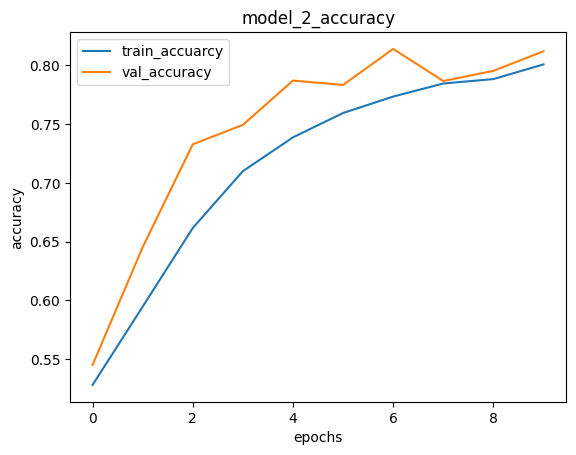

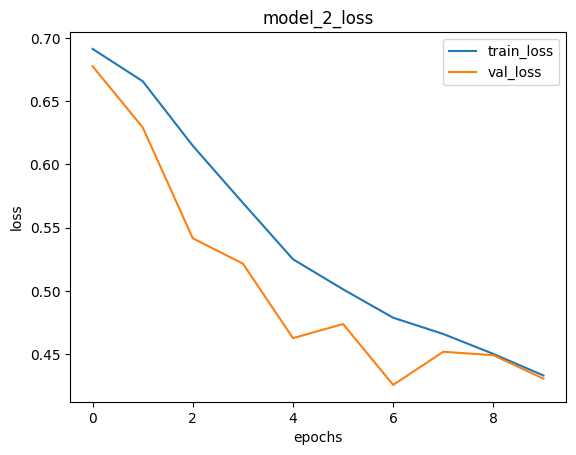

In [ ]:
plot_loss_curve(history_2.history, 'model_2')

Like I though, we reached even better results with augmented data

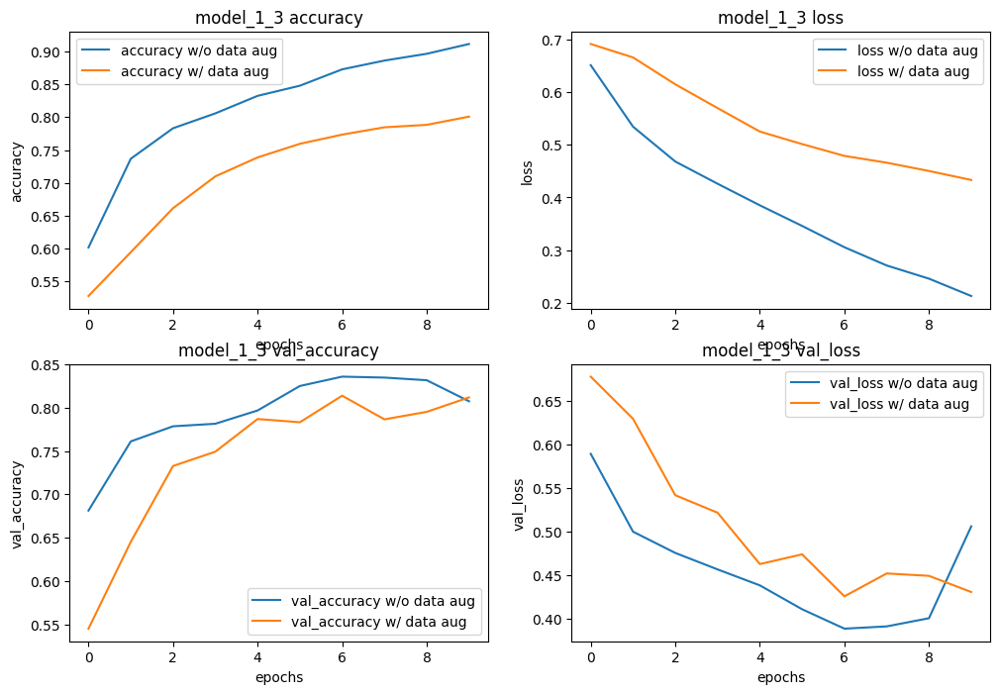

In [ ]:
compare_model_performence(history_1_3_full.history, history_2.history, 'model_1_3')

We can observe in the bottom left image that without data augmentation at a certain point the loss goes upward which means the model start to overfit. But with augmented data goes downward which means if we train the model for longer the loss will continue to decrease

Let's train `model_2` for 20 more epochs to check if there's some improvements the

In [ ]:
model_2.compile(loss=losses.BinaryCrossentropy(),
                optimizer=optimizers.Adam(),
                metrics=['accuracy'])

history_2_1 = model_2.fit(train_data_aug,
                        validation_data=val_data,
                        steps_per_epoch=len(train_data_aug),
                        validation_steps=len(val_data),
                        epochs=30)


Epoch 1/30
391/391 [==============================] - 200s 505ms/step - loss: 0.4223 - accuracy: 0.8060 - val_loss: 0.3641 - val_accuracy: 0.8416
Epoch 2/30
391/391 [==============================] - 193s 494ms/step - loss: 0.4025 - accuracy: 0.8178 - val_loss: 0.3531 - val_accuracy: 0.8489
Epoch 3/30
391/391 [==============================] - 196s 501ms/step - loss: 0.4006 - accuracy: 0.8199 - val_loss: 0.3343 - val_accuracy: 0.8569
Epoch 4/30
391/391 [==============================] - 190s 486ms/step - loss: 0.3819 - accuracy: 0.8289 - val_loss: 0.3351 - val_accuracy: 0.8585
Epoch 5/30
391/391 [==============================] - 196s 502ms/step - loss: 0.3729 - accuracy: 0.8317 - val_loss: 0.3999 - val_accuracy: 0.8359
Epoch 6/30
391/391 [==============================] - 197s 503ms/step - loss: 0.3577 - accuracy: 0.8417 - val_loss: 0.2990 - val_accuracy: 0.8761
Epoch 7/30
391/391 [==============================] - 193s 493ms/step - loss: 0.3509 - accuracy: 0.8445 - val_loss: 0.3177 -

In [ ]:
model_2_accuracy_new = model_2.evaluate(test_data)
model_2_accuracy_new

157/157 [==============================] - 12s 76ms/step - loss: 0.2153 - accuracy: 0.9130


[0.21526943147182465, 0.9129999876022339]

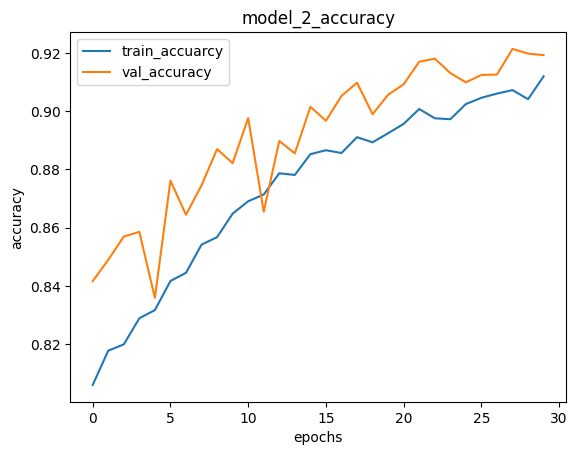

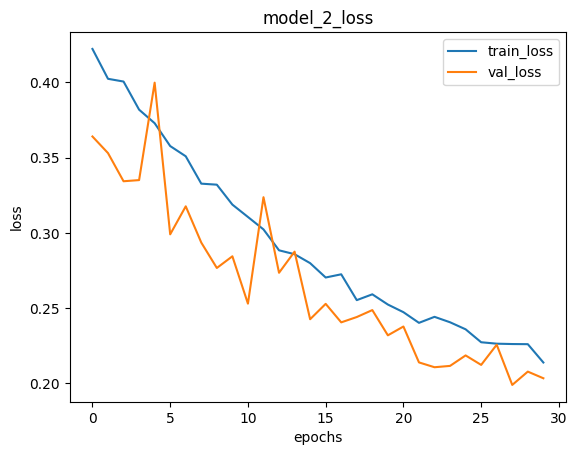

In [ ]:
plot_loss_curve(history_2_1.history, 'model_2')

As I though, training the model for longuer did increased its accuracy. Ufortunatly at some point the the accuray of the model stopped to increase (at 90%)

In [ ]:
# let's save the model
model_2.save('cat_dog_model.h5')

In [ ]:
# load and test the saved model
model_2_loaded = tf.keras.models.load_model('cat_dog_model.h5')
model_2_loaded.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_11 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 111, 111, 32)     0         
 2D)                                                             
                                                                 
 conv2d_12 (Conv2D)          (None, 109, 109, 32)      9248      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 54, 54, 32)       0         
 2D)                                                             
                                                                 
 conv2d_13 (Conv2D)          (None, 52, 52, 32)        9248      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 26, 26, 32)      

In [ ]:
model_2_loaded.evaluate(test_data)

157/157 [==============================] - 13s 78ms/step - loss: 0.2153 - accuracy: 0.9130


[0.21526943147182465, 0.9129999876022339]

let's see if we can improve the performence of `model_2`

In [ ]:
model_3 = Sequential([
    layers.Conv2D(input_shape=(224, 224, 3),
                  filters=32,
                  kernel_size=3,
                  strides=1,
                  padding='valid',
                  activation=activations.relu),
    layers.MaxPool2D(),
    layers.Dropout(0.25),
    layers.Conv2D(64, 3, activation=activations.relu),
    layers.MaxPool2D(),
    layers.Dropout(0.25),
    layers.Conv2D(128, 3, activation=activations.relu),
    layers.MaxPool2D(),
    layers.Dropout(0.25),
    layers.Conv2D(128, 3, activation=activations.relu),
    layers.MaxPool2D(),
    layers.Dropout(0.25),
    layers.Flatten(),
    # layers.Dense(256, activation='relu'),
    layers.Dense(1, activation=activations.sigmoid)
])

model_3.compile(loss=losses.BinaryCrossentropy(),
                  optimizer=optimizers.Adam(),
                  metrics=['accuracy'])


history_3 = model_3.fit(train_data,
            validation_data=val_data,
            steps_per_epoch=len(train_data),
            validation_steps=len(val_data),
            epochs=10)

Epoch 1/10
391/391 [==============================] - 66s 163ms/step - loss: 0.6803 - accuracy: 0.5526 - val_loss: 0.6584 - val_accuracy: 0.6524
Epoch 2/10
391/391 [==============================] - 61s 157ms/step - loss: 0.5880 - accuracy: 0.6790 - val_loss: 0.5561 - val_accuracy: 0.7103
Epoch 3/10
391/391 [==============================] - 58s 149ms/step - loss: 0.5296 - accuracy: 0.7302 - val_loss: 0.5110 - val_accuracy: 0.7415
Epoch 4/10
391/391 [==============================] - 58s 147ms/step - loss: 0.4918 - accuracy: 0.7596 - val_loss: 0.4455 - val_accuracy: 0.7843
Epoch 5/10
391/391 [==============================] - 52s 133ms/step - loss: 0.4404 - accuracy: 0.7956 - val_loss: 0.4480 - val_accuracy: 0.7929
Epoch 6/10
391/391 [==============================] - 56s 142ms/step - loss: 0.3990 - accuracy: 0.8207 - val_loss: 0.4298 - val_accuracy: 0.7913
Epoch 7/10
391/391 [==============================] - 56s 142ms/step - loss: 0.3648 - accuracy: 0.8411 - val_loss: 0.3783 - val_ac

In [ ]:
model_3_accuracy = model_3.evaluate(test_data)
model_3_accuracy, model_2_accuracy

157/157 [==============================] - 11s 72ms/step - loss: 0.3813 - accuracy: 0.8422


([0.3813396096229553, 0.842199981212616],
 [0.432232141494751, 0.8166000247001648])

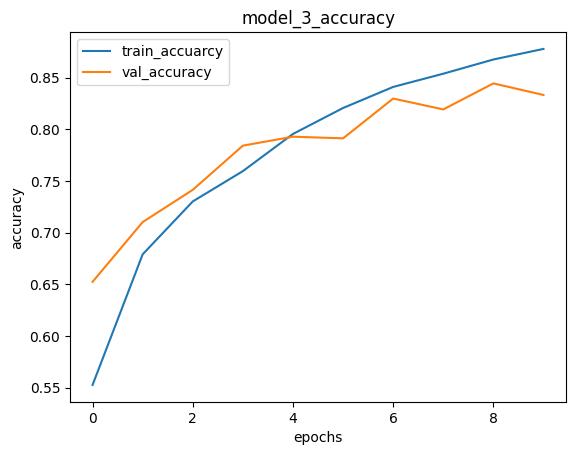

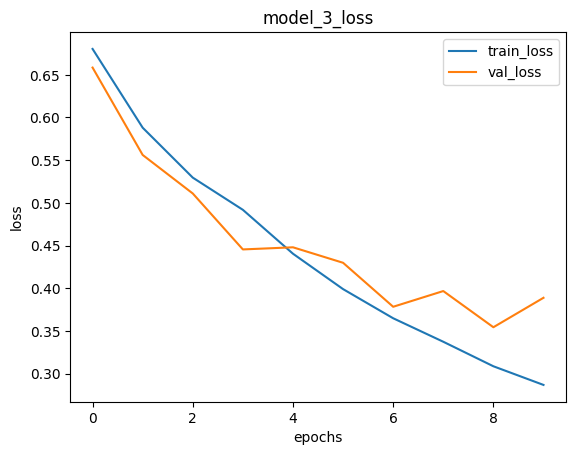

In [ ]:
plot_loss_curve(history_3.history, 'model_3')

Okay we see some improvements here. After 10 epochs `model_3` (trained on non augemented data) is performing better than `model_2` (trained on augemnted data) by adding  droput layers. But is seems that the model started to overfit toward the end of it's training...Let's train it on te augmented data

In [ ]:
# fit the model for longer

model_4 = clone_model(model_3)
model_4.compile(loss=losses.BinaryCrossentropy(),
                  optimizer=optimizers.Adam(),
                  metrics=['accuracy'])


history_4 = model_4.fit(train_data_aug,
            validation_data=val_data,
            steps_per_epoch=len(train_data),
            validation_steps=len(val_data),
            epochs=10)

Epoch 1/10
391/391 [==============================] - 189s 477ms/step - loss: 0.6896 - accuracy: 0.5476 - val_loss: 0.7116 - val_accuracy: 0.5087
Epoch 2/10
391/391 [==============================] - 182s 466ms/step - loss: 0.6654 - accuracy: 0.5977 - val_loss: 0.6446 - val_accuracy: 0.6327
Epoch 3/10
391/391 [==============================] - 183s 468ms/step - loss: 0.6303 - accuracy: 0.6466 - val_loss: 0.5903 - val_accuracy: 0.6871
Epoch 4/10
197/391 [==============>...............] - ETA: 1:23 - loss: 0.5986 - accuracy: 0.6745

It seems that with data augmentation our `model_3` got worse for some reason...

### 7. Use a pre-trained model for check if it can reach better performences

Let's use the famous `EfficientNetB0` pretrained model and how it performs. What we are going to do:

1. Fit the pretrained model on the 10 percent training data
2. Fit the pretrained model on the 10 percent training data augmnented
3. Fit the pretrained model on the full training data
4. Fit the pretrained model on the full training data augmented

In [ ]:
import tensorflow_hub as hub

In [ ]:
# get the link of the pretrained model
efficientnet_url = 'https://tfhub.dev/tensorflow/efficientnet/b0/classification/1'

In [ ]:
model_4 = Sequential([
    hub.KerasLayer(efficientnet_url,
                   trainable=False,
                   input_shape=(224, 224, 3),
                   name='feature_extraction_layer'),
    layers.Dense(1,
                 activation=activations.sigmoid,
                 name='output_layer')
    ])


model_4.compile(loss=losses.BinaryCrossentropy(),
                optimizer=optimizers.Adam(),
                metrics=["accuracy"])

model_4.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 feature_extraction_layer (K  (None, 1000)             5330564   
 erasLayer)                                                      
                                                                 
 output_layer (Dense)        (None, 1)                 1001      
                                                                 
Total params: 5,331,565
Trainable params: 1,001
Non-trainable params: 5,330,564
_________________________________________________________________


In [ ]:
# fit the model on 10% of the data
history_4 = model_4.fit(image_data_gen_10_percent_train,
                        validation_data=image_data_gen_10_percent_val,
                        steps_per_epoch=len(image_data_gen_10_percent_train),
                        validation_steps=len(image_data_gen_10_percent_val),
                        epochs=10)

Epoch 1/10
40/40 [==============================] - 26s 191ms/step - loss: 0.6848 - accuracy: 0.7360 - val_loss: 0.6783 - val_accuracy: 0.8413
Epoch 2/10
40/40 [==============================] - 6s 143ms/step - loss: 0.6741 - accuracy: 0.8896 - val_loss: 0.6681 - val_accuracy: 0.9453
Epoch 3/10
40/40 [==============================] - 5s 117ms/step - loss: 0.6641 - accuracy: 0.9472 - val_loss: 0.6582 - val_accuracy: 0.9667
Epoch 4/10
40/40 [==============================] - 8s 194ms/step - loss: 0.6543 - accuracy: 0.9704 - val_loss: 0.6484 - val_accuracy: 0.9760
Epoch 5/10
40/40 [==============================] - 5s 115ms/step - loss: 0.6446 - accuracy: 0.9728 - val_loss: 0.6389 - val_accuracy: 0.9747
Epoch 6/10
40/40 [==============================] - 6s 146ms/step - loss: 0.6350 - accuracy: 0.9800 - val_loss: 0.6297 - val_accuracy: 0.9760
Epoch 7/10
40/40 [==============================] - 5s 135ms/step - loss: 0.6256 - accuracy: 0.9840 - val_loss: 0.6205 - val_accuracy: 0.9747
Epoch

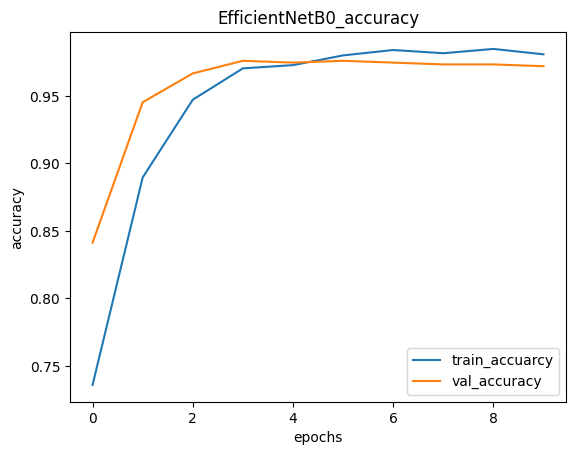

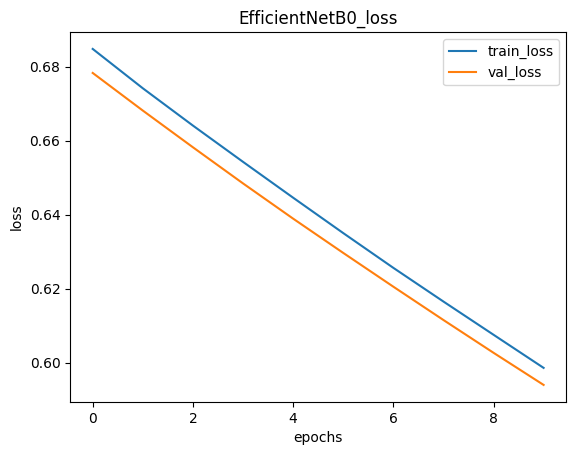

In [ ]:
plot_loss_curve(history_4.history, 'EfficientNetB0')

In [ ]:
model_4_accuracy = model_4.evaluate(image_data_gen_10_percent_test)
model_4_accuracy

16/16 [==============================] - 2s 91ms/step - loss: 0.5927 - accuracy: 0.9740


[0.5927153825759888, 0.9739999771118164]

As we can expect, `model_4` (pretrained model) performence outclassed all models we have built so far, especially `model_2` (90% accuracy) with an accuracy over 95% and has been fit only the 10 percent of the data (without data augmentation). We can alse notice after just 4 epochs the accuracy of `model_4` stopped increasing on the validation set...

Let's use data augmentation to see if the model can improve further more.

In [ ]:
model_4_1 = clone_model(model_4)

model_4_1.compile(loss=losses.BinaryCrossentropy(),
                optimizer=optimizers.Adam(),
                metrics=['accuracy'])

history_4_1 = model_4_1.fit(image_data_gen_10_percent_aug,
                          validation_data=image_data_gen_10_percent_val,
                          steps_per_epoch=len(image_data_gen_10_percent_aug),
                          validation_steps=len(image_data_gen_10_percent_val),
                          epochs=10)



Epoch 1/10
40/40 [==============================] - 30s 486ms/step - loss: 0.6861 - accuracy: 0.8320 - val_loss: 0.6812 - val_accuracy: 0.8840
Epoch 2/10
40/40 [==============================] - 19s 462ms/step - loss: 0.6761 - accuracy: 0.9256 - val_loss: 0.6711 - val_accuracy: 0.9413
Epoch 3/10
40/40 [==============================] - 18s 449ms/step - loss: 0.6666 - accuracy: 0.9520 - val_loss: 0.6614 - val_accuracy: 0.9533
Epoch 4/10
40/40 [==============================] - 19s 473ms/step - loss: 0.6571 - accuracy: 0.9600 - val_loss: 0.6517 - val_accuracy: 0.9613
Epoch 5/10
40/40 [==============================] - 18s 443ms/step - loss: 0.6471 - accuracy: 0.9672 - val_loss: 0.6421 - val_accuracy: 0.9653
Epoch 6/10
40/40 [==============================] - 18s 463ms/step - loss: 0.6383 - accuracy: 0.9664 - val_loss: 0.6328 - val_accuracy: 0.9627
Epoch 7/10
40/40 [==============================] - 18s 451ms/step - loss: 0.6288 - accuracy: 0.9712 - val_loss: 0.6237 - val_accuracy: 0.9667

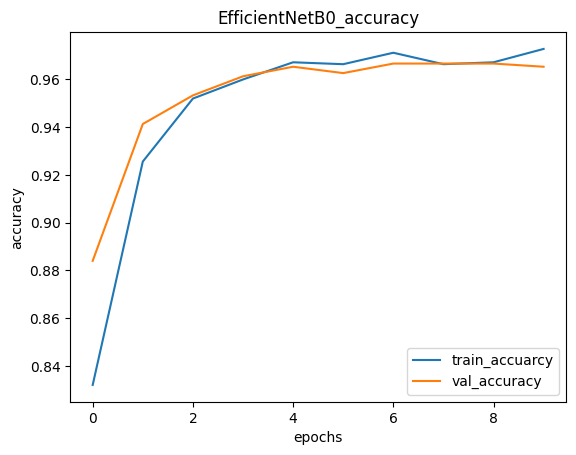

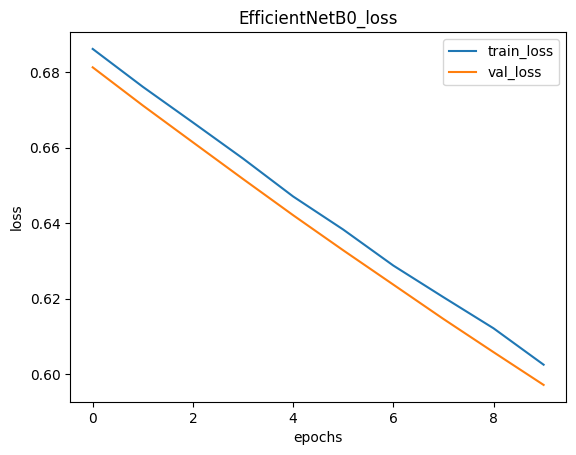

In [ ]:
plot_loss_curve(history_4_1.history, 'EfficientNetB0')

Humm it seems that data augmentation did not help very much. Since the data is very low it is pretty normal. Now let's use the full data on the model

In [ ]:
model_4_2 = clone_model(model_4)

model_4_2.compile(loss=losses.BinaryCrossentropy(),
                optimizer=optimizers.Adam(),
                metrics=['accuracy'])

history_4_2 = model_4_2.fit(train_data,
                          validation_data=val_data,
                          steps_per_epoch=len(train_data),
                          validation_steps=len(val_data),
                          epochs=10)


Epoch 1/10
391/391 [==============================] - 86s 200ms/step - loss: 0.6441 - accuracy: 0.9274 - val_loss: 0.5976 - val_accuracy: 0.9744
Epoch 2/10
391/391 [==============================] - 51s 130ms/step - loss: 0.5570 - accuracy: 0.9731 - val_loss: 0.5181 - val_accuracy: 0.9741
Epoch 3/10
391/391 [==============================] - 51s 131ms/step - loss: 0.4844 - accuracy: 0.9735 - val_loss: 0.4520 - val_accuracy: 0.9739
Epoch 4/10
391/391 [==============================] - 50s 127ms/step - loss: 0.4240 - accuracy: 0.9733 - val_loss: 0.3970 - val_accuracy: 0.9739
Epoch 5/10
391/391 [==============================] - 48s 122ms/step - loss: 0.3737 - accuracy: 0.9737 - val_loss: 0.3510 - val_accuracy: 0.9735
Epoch 6/10
391/391 [==============================] - 49s 126ms/step - loss: 0.3314 - accuracy: 0.9730 - val_loss: 0.3122 - val_accuracy: 0.9737
Epoch 7/10
391/391 [==============================] - 52s 133ms/step - loss: 0.2956 - accuracy: 0.9735 - val_loss: 0.2795 - val_ac

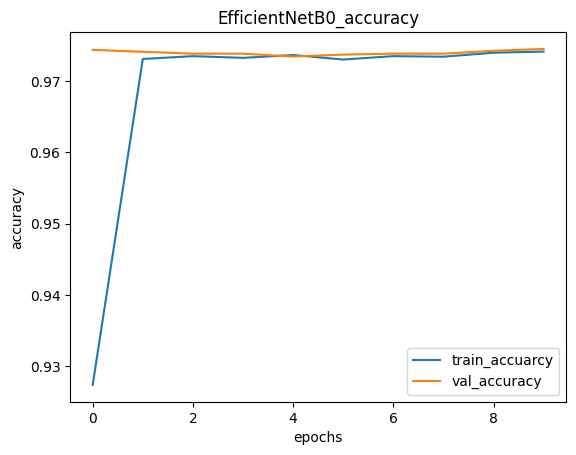

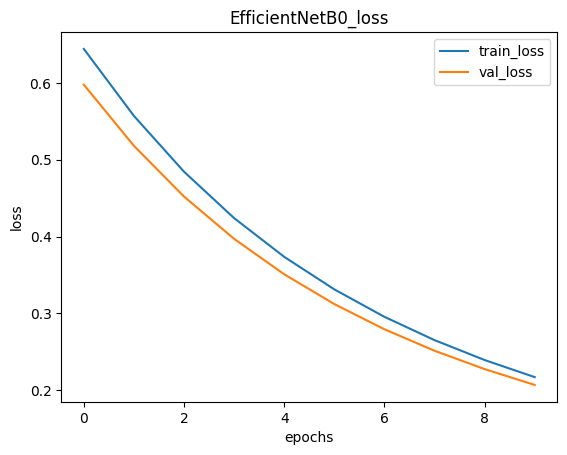

In [ ]:
plot_loss_curve(history_4_2.history, 'EfficientNetB0')

Still no improvement. Let's use data augmentation of the full data

In [ ]:
model_4_3 = clone_model(model_4)

model_4_3.compile(loss=losses.BinaryCrossentropy(),
                optimizer=optimizers.Adam(),
                metrics=['accuracy'])

history_4_3 = model_4_3.fit(train_data_aug,
                          validation_data=val_data,
                          steps_per_epoch=len(train_data),
                          validation_steps=len(val_data),
                          epochs=3)

Epoch 1/3
391/391 [==============================] - 191s 462ms/step - loss: 0.6418 - accuracy: 0.9412 - val_loss: 0.5928 - val_accuracy: 0.9735
Epoch 2/3
391/391 [==============================] - 179s 457ms/step - loss: 0.5572 - accuracy: 0.9699 - val_loss: 0.5138 - val_accuracy: 0.9733
Epoch 3/3
391/391 [==============================] - 179s 457ms/step - loss: 0.4876 - accuracy: 0.9676 - val_loss: 0.4482 - val_accuracy: 0.9731


In [ ]:
model_4_3.evaluate(test_data)

157/157 [==============================] - 13s 82ms/step - loss: 0.4479 - accuracy: 0.9734


[0.4478859305381775, 0.9733999967575073]

In [ ]:
model_4_accuracy

[0.5927153825759888, 0.9739999771118164]

In [ ]:
# Let's save the model
model_4.save('cat_dog_pretrained.h5')

### 8. Compare and evaluate the best models

We are going to compare the performence of `model_2` and `model_4` (pretrained)

In [ ]:
# turn the test data into batches but not shuffled this time (for evaluation purposes)

test_data_not_shuffled = ImageDataGenerator(rescale=1./255).flow_from_directory(directory=test_dir,
                                                                                target_size=IMG_SHAPE,
                                                                                batch_size=BATCH_SIZE,
                                                                                class_mode='binary',
                                                                                shuffle=False)

Found 5000 images belonging to 2 classes.


In [ ]:
len(test_data_not_shuffled)

157

In [ ]:
# get the true labels
y_labels = test_data_not_shuffled.classes
y_labels, len(y_labels)

(array([0, 0, 0, ..., 1, 1, 1], dtype=int32), 5000)

In [ ]:
import tensorflow_hub as hub

custom_objects = {'KerasLayer': hub.KerasLayer}

model_2 = tf.keras.models.load_model('cat_dog_model.h5')
model_4 = tf.keras.models.load_model('/content/cat_dog_pretrained.h5',  )
model_2.summary(), model_4.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_11 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 111, 111, 32)     0         
 2D)                                                             
                                                                 
 conv2d_12 (Conv2D)          (None, 109, 109, 32)      9248      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 54, 54, 32)       0         
 2D)                                                             
                                                                 
 conv2d_13 (Conv2D)          (None, 52, 52, 32)        9248      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 26, 26, 32)      

(None, None)

In [ ]:
# evaluate the model 2 on the not shuffled test data
model_2.evaluate(test_data_not_shuffled)

157/157 [==============================] - 124s 786ms/step - loss: 0.2153 - accuracy: 0.9130


[0.21526943147182465, 0.9129999876022339]

In [ ]:
model_4.evaluate(test_data_not_shuffled)

157/157 [==============================] - 381s 2s/step - loss: 0.5929 - accuracy: 0.9760


[0.5928509831428528, 0.9760000109672546]

In [ ]:
# make prediction on model 2
y_preds_model_2 = tf.round(model_2.predict(test_data_not_shuffled))
y_preds_model_4 = tf.round(model_4.predict(test_data_not_shuffled))
y_preds_model_2.numpy(), y_preds_model_4.numpy()

157/157 [==============================] - 386s 2s/step


(array([[0.],
        [0.],
        [0.],
        ...,
        [1.],
        [1.],
        [1.]], dtype=float32),
 array([[0.],
        [0.],
        [0.],
        ...,
        [1.],
        [1.],
        [1.]], dtype=float32))

In [ ]:
import numpy as np

np.mean(tf.squeeze(y_preds_model_2).numpy() == y_labels), np.mean(tf.squeeze(y_preds_model_4).numpy() == y_labels)

(0.913, 0.976)

In [ ]:
# import some metrics from the sklearn library
from sklearn.metrics import classification_report, f1_score, confusion_matrix, roc_curve, roc_auc_score

#### Classification report

In [ ]:
print(classification_report(y_true=y_labels, y_pred=y_preds_model_2))

              precision    recall  f1-score   support

           0       0.90      0.93      0.91      2500
           1       0.93      0.89      0.91      2500

    accuracy                           0.91      5000
   macro avg       0.91      0.91      0.91      5000
weighted avg       0.91      0.91      0.91      5000



In [ ]:
print(classification_report(y_true=y_labels, y_pred=y_preds_model_4))

              precision    recall  f1-score   support

           0       0.98      0.97      0.98      2500
           1       0.97      0.98      0.98      2500

    accuracy                           0.98      5000
   macro avg       0.98      0.98      0.98      5000
weighted avg       0.98      0.98      0.98      5000



#### Confusion matrix

In [ ]:
import seaborn as sns

In [ ]:
model_2_conf_mat = confusion_matrix(y_true=y_labels, y_pred=y_preds_model_2)
model_4_conf_mat = confusion_matrix(y_true=y_labels, y_pred=y_preds_model_4)

Text(0.5, 1.0, 'EfficentNetB0')

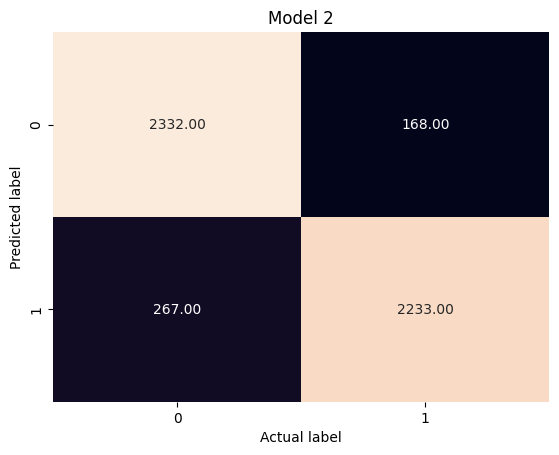

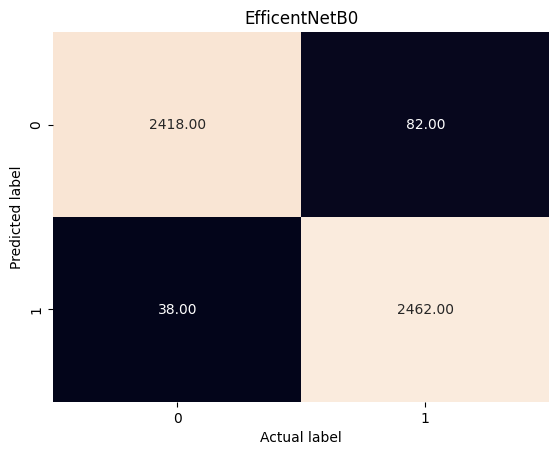

In [ ]:
plt.figure()
sns.heatmap(model_2_conf_mat, annot=True, cbar=False, fmt='.2f')
plt.xlabel('Actual label')
plt.ylabel('Predicted label')
plt.title('Model 2')

plt.figure()
sns.heatmap(model_4_conf_mat, annot=True, cbar=False, fmt='.2f')
plt.xlabel('Actual label')
plt.ylabel('Predicted label')
plt.title('EfficentNetB0')

#### ROC curve

In [ ]:
y_preds_model_2_prob =  model_2.predict(test_data_not_shuffled)

157/157 [==============================] - 120s 755ms/step


In [ ]:
y_preds_model_4_prob =  model_4.predict(test_data_not_shuffled)

157/157 [==============================] - 406s 3s/step


In [ ]:
def plot_roc_curve(y_true, y_proba, model_name):
    fig, axis = plt.subplots(figsize=(10, 6))
    fpr, tpr, thresh = roc_curve(y_true, y_proba)
    axis.plot(fpr, tpr, linestyle='--', color='green', label= 'AUC:' + ' ' + '%.2f'
                                               % roc_auc_score(y_true, y_proba))
    axis.plot([0, 1], [0, 1], color='red')
    plt.xlabel("False positive rate (fpr)")
    plt.ylabel("True positive rate (tpr)")
    plt.title(f"{model_name} Receiver Operating Characteristic (ROC) curve")
    plt.legend()

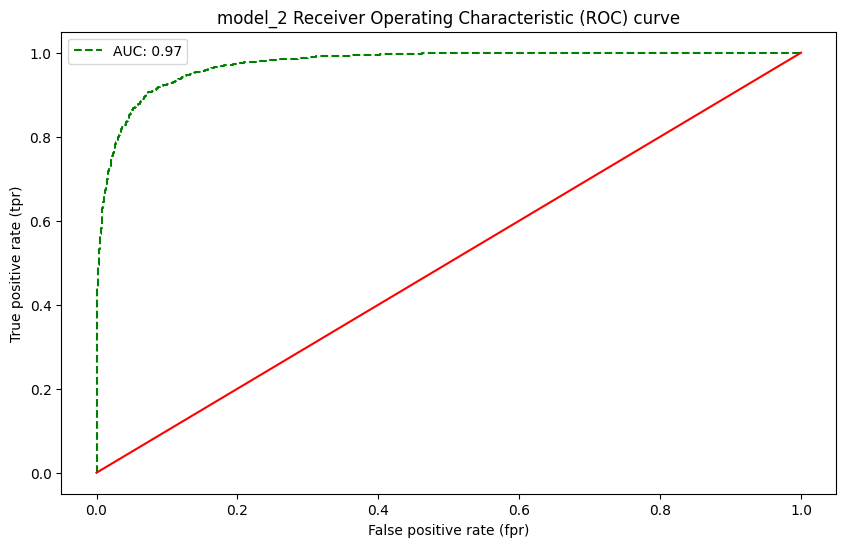

<Figure size 640x480 with 0 Axes>

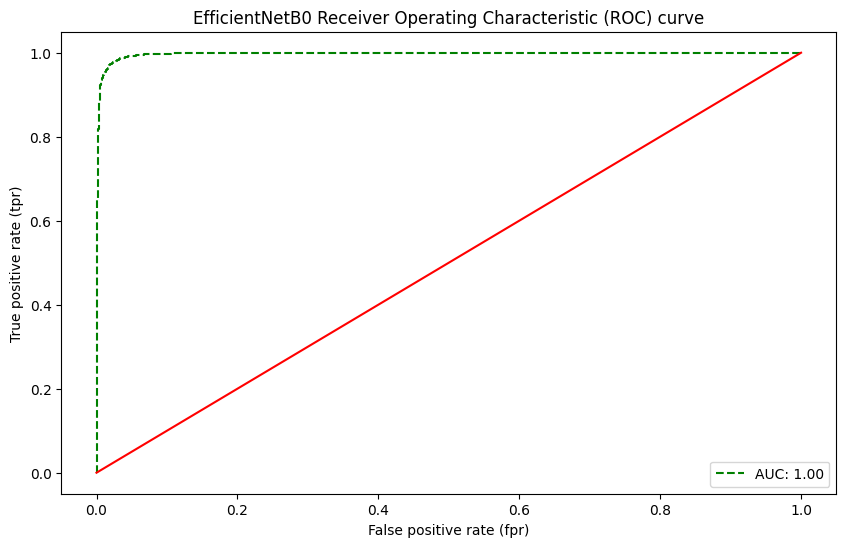

In [ ]:
# plot roc curve for model_2 and EfficientNetB0

plot_roc_curve(y_true=y_labels, y_proba=y_preds_model_2_prob, model_name='model_2')
plt.figure()
plot_roc_curve(y_true=y_labels, y_proba=y_preds_model_4_prob, model_name='EfficientNetB0')

#### See the wrong predictions

In [ ]:
test_data_not_shuffled.class_indices

{'cats': 0, 'dogs': 1}

In [ ]:
import pandas as pd

def predictions_df(y_preds):

 return pd.DataFrame( {"image_path": test_data_not_shuffled.filepaths,
 "true_labels": y_labels,
 "true_labels_classnames": ['cat' if label == 0 else 'dog' for label in y_labels],
 "predicted_labels_class_names": ['cat' if label == 0 else 'dog' for label in y_preds],
 }

)

##### Model 2 wrong predictions

In [ ]:
model_2_prediction_df = predictions_df(y_preds_model_2)
model_2_prediction_df

,image_path,true_labels,true_labels_classnames,predicted_labels_class_names
0,cats_dogs/test/cats/cat.1.jpg,0,cat,cat
1,cats_dogs/test/cats/cat.10.jpg,0,cat,cat
2,cats_dogs/test/cats/cat.10003.jpg,0,cat,cat
3,cats_dogs/test/cats/cat.10006.jpg,0,cat,cat
4,cats_dogs/test/cats/cat.10009.jpg,0,cat,cat
...,...,...,...,...
4995,cats_dogs/test/dogs/dog.997.jpg,1,dog,dog
4996,cats_dogs/test/dogs/dog.9978.jpg,1,dog,dog
4997,cats_dogs/test/dogs/dog.9981.jpg,1,dog,dog
4998,cats_dogs/test/dogs/dog.9985.jpg,1,dog,dog


In [ ]:
# add a correct prediction column
model_2_prediction_df['is_pred_correct'] = model_2_prediction_df['true_labels_classnames'] == model_2_prediction_df['predicted_labels_class_names']
model_2_prediction_df

,image_path,true_labels,true_labels_classnames,predicted_labels_class_names,is_pred_correct
0,cats_dogs/test/cats/cat.1.jpg,0,cat,cat,True
1,cats_dogs/test/cats/cat.10.jpg,0,cat,cat,True
2,cats_dogs/test/cats/cat.10003.jpg,0,cat,cat,True
3,cats_dogs/test/cats/cat.10006.jpg,0,cat,cat,True
4,cats_dogs/test/cats/cat.10009.jpg,0,cat,cat,True
...,...,...,...,...,...
4995,cats_dogs/test/dogs/dog.997.jpg,1,dog,dog,True
4996,cats_dogs/test/dogs/dog.9978.jpg,1,dog,dog,True
4997,cats_dogs/test/dogs/dog.9981.jpg,1,dog,dog,True
4998,cats_dogs/test/dogs/dog.9985.jpg,1,dog,dog,True


In [ ]:
# get all the false predictions
model_2_prediction_df[model_2_prediction_df['is_pred_correct']==False]

,image_path,true_labels,true_labels_classnames,predicted_labels_class_names,is_pred_correct
13,cats_dogs/test/cats/cat.10037.jpg,0,cat,dog,False
23,cats_dogs/test/cats/cat.10089.jpg,0,cat,dog,False
24,cats_dogs/test/cats/cat.10094.jpg,0,cat,dog,False
31,cats_dogs/test/cats/cat.10121.jpg,0,cat,dog,False
51,cats_dogs/test/cats/cat.10222.jpg,0,cat,dog,False
...,...,...,...,...,...
4929,cats_dogs/test/dogs/dog.9681.jpg,1,dog,cat,False
4939,cats_dogs/test/dogs/dog.972.jpg,1,dog,cat,False
4957,cats_dogs/test/dogs/dog.981.jpg,1,dog,cat,False
4965,cats_dogs/test/dogs/dog.9864.jpg,1,dog,cat,False


In [ ]:
# get all the wrong pred's model 2 filepaths
model_2_wrong_preds = model_2_prediction_df[model_2_prediction_df['is_pred_correct']==False]['image_path'].values
model_2_wrong_preds[:10]

array(['cats_dogs/test/cats/cat.10037.jpg',
       'cats_dogs/test/cats/cat.10089.jpg',
       'cats_dogs/test/cats/cat.10094.jpg',
       'cats_dogs/test/cats/cat.10121.jpg',
       'cats_dogs/test/cats/cat.10222.jpg',
       'cats_dogs/test/cats/cat.10270.jpg',
       'cats_dogs/test/cats/cat.10283.jpg',
       'cats_dogs/test/cats/cat.10339.jpg',
       'cats_dogs/test/cats/cat.10476.jpg',
       'cats_dogs/test/cats/cat.10488.jpg'], dtype=object)

##### EfficientNetB0 wrong predictions

In [ ]:
model_4_prediction_df = predictions_df(y_preds_model_4)
model_4_prediction_df

,image_path,true_labels,true_labels_classnames,predicted_labels_class_names
0,cats_dogs/test/cats/cat.1.jpg,0,cat,cat
1,cats_dogs/test/cats/cat.10.jpg,0,cat,cat
2,cats_dogs/test/cats/cat.10003.jpg,0,cat,cat
3,cats_dogs/test/cats/cat.10006.jpg,0,cat,cat
4,cats_dogs/test/cats/cat.10009.jpg,0,cat,cat
...,...,...,...,...
4995,cats_dogs/test/dogs/dog.997.jpg,1,dog,dog
4996,cats_dogs/test/dogs/dog.9978.jpg,1,dog,dog
4997,cats_dogs/test/dogs/dog.9981.jpg,1,dog,dog
4998,cats_dogs/test/dogs/dog.9985.jpg,1,dog,dog


In [ ]:
# add a correct prediction column
model_4_prediction_df['is_pred_correct'] = model_4_prediction_df['true_labels_classnames'] == model_4_prediction_df['predicted_labels_class_names']
model_4_prediction_df

,image_path,true_labels,true_labels_classnames,predicted_labels_class_names,is_pred_correct
0,cats_dogs/test/cats/cat.1.jpg,0,cat,cat,True
1,cats_dogs/test/cats/cat.10.jpg,0,cat,cat,True
2,cats_dogs/test/cats/cat.10003.jpg,0,cat,cat,True
3,cats_dogs/test/cats/cat.10006.jpg,0,cat,cat,True
4,cats_dogs/test/cats/cat.10009.jpg,0,cat,cat,True
...,...,...,...,...,...
4995,cats_dogs/test/dogs/dog.997.jpg,1,dog,dog,True
4996,cats_dogs/test/dogs/dog.9978.jpg,1,dog,dog,True
4997,cats_dogs/test/dogs/dog.9981.jpg,1,dog,dog,True
4998,cats_dogs/test/dogs/dog.9985.jpg,1,dog,dog,True


In [ ]:
# get all the false predictions
model_4_prediction_df[model_4_prediction_df['is_pred_correct']==False]

,image_path,true_labels,true_labels_classnames,predicted_labels_class_names,is_pred_correct
31,cats_dogs/test/cats/cat.10121.jpg,0,cat,dog,False
63,cats_dogs/test/cats/cat.10270.jpg,0,cat,dog,False
65,cats_dogs/test/cats/cat.10283.jpg,0,cat,dog,False
73,cats_dogs/test/cats/cat.10335.jpg,0,cat,dog,False
107,cats_dogs/test/cats/cat.10471.jpg,0,cat,dog,False
...,...,...,...,...,...
4744,cats_dogs/test/dogs/dog.8800.jpg,1,dog,cat,False
4809,cats_dogs/test/dogs/dog.9076.jpg,1,dog,cat,False
4911,cats_dogs/test/dogs/dog.9605.jpg,1,dog,cat,False
4929,cats_dogs/test/dogs/dog.9681.jpg,1,dog,cat,False


In [ ]:
# get all the wrong pred's model 2 filepaths
model_4_wrong_preds = model_4_prediction_df[model_4_prediction_df['is_pred_correct']==False]['image_path'].values
model_4_wrong_preds[:10]

array(['cats_dogs/test/cats/cat.10121.jpg',
       'cats_dogs/test/cats/cat.10270.jpg',
       'cats_dogs/test/cats/cat.10283.jpg',
       'cats_dogs/test/cats/cat.10335.jpg',
       'cats_dogs/test/cats/cat.10471.jpg',
       'cats_dogs/test/cats/cat.108.jpg',
       'cats_dogs/test/cats/cat.10961.jpg',
       'cats_dogs/test/cats/cat.10966.jpg',
       'cats_dogs/test/cats/cat.11141.jpg',
       'cats_dogs/test/cats/cat.11222.jpg'], dtype=object)

In [ ]:
# see the common wrong prediction in both model

wrong_common_preds = [filepath for filepath in model_2_wrong_preds if filepath in model_4_wrong_preds]
wrong_common_preds, len(wrong_common_preds)

(['cats_dogs/test/cats/cat.10121.jpg',
  'cats_dogs/test/cats/cat.10270.jpg',
  'cats_dogs/test/cats/cat.10283.jpg',
  'cats_dogs/test/cats/cat.11222.jpg',
  'cats_dogs/test/cats/cat.11735.jpg',
  'cats_dogs/test/cats/cat.1307.jpg',
  'cats_dogs/test/cats/cat.1507.jpg',
  'cats_dogs/test/cats/cat.166.jpg',
  'cats_dogs/test/cats/cat.1742.jpg',
  'cats_dogs/test/cats/cat.1814.jpg',
  'cats_dogs/test/cats/cat.1901.jpg',
  'cats_dogs/test/cats/cat.2355.jpg',
  'cats_dogs/test/cats/cat.2561.jpg',
  'cats_dogs/test/cats/cat.2663.jpg',
  'cats_dogs/test/cats/cat.2735.jpg',
  'cats_dogs/test/cats/cat.2748.jpg',
  'cats_dogs/test/cats/cat.3697.jpg',
  'cats_dogs/test/cats/cat.3845.jpg',
  'cats_dogs/test/cats/cat.5347.jpg',
  'cats_dogs/test/cats/cat.5355.jpg',
  'cats_dogs/test/cats/cat.6442.jpg',
  'cats_dogs/test/cats/cat.6734.jpg',
  'cats_dogs/test/cats/cat.7122.jpg',
  'cats_dogs/test/cats/cat.9410.jpg',
  'cats_dogs/test/cats/cat.9444.jpg',
  'cats_dogs/test/cats/cat.9626.jpg',
  'cats_

Now that we have all wrong predictions, let's create a function to plot them

In [ ]:
def plot_wrong_preds(wrong_preds):
  plt.figure(figsize=(15, 15))
  random_filepaths = random.sample(wrong_preds, 20)
  for i in range(len(random_filepaths)):
    # make a 3x3 subplot(plot 9 images)
    plt.subplot(5, 4, i+1)
    # read the image
    img = plt.imread(random_filepaths[i])
    # plot the image
    plt.imshow(img)
    plt.axis(False)


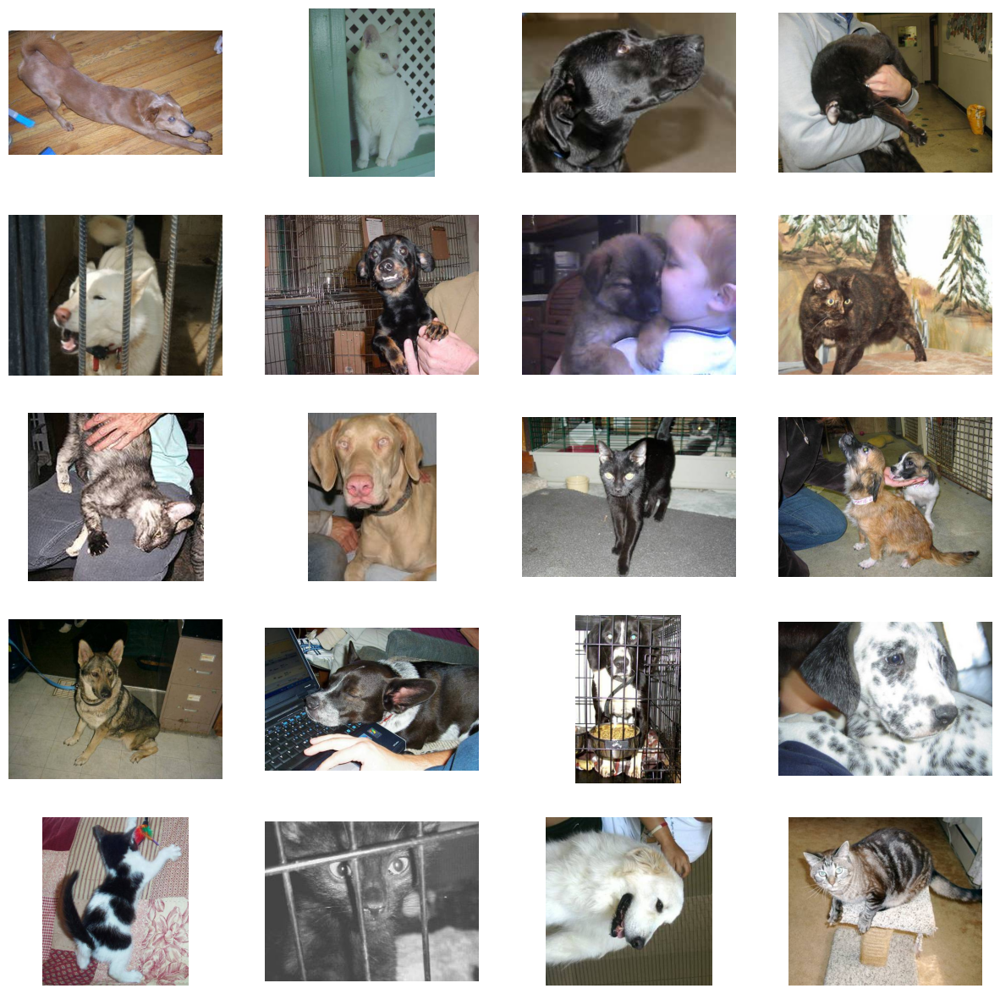

In [ ]:
# model_2
plot_wrong_preds(model_2_wrong_preds.tolist())

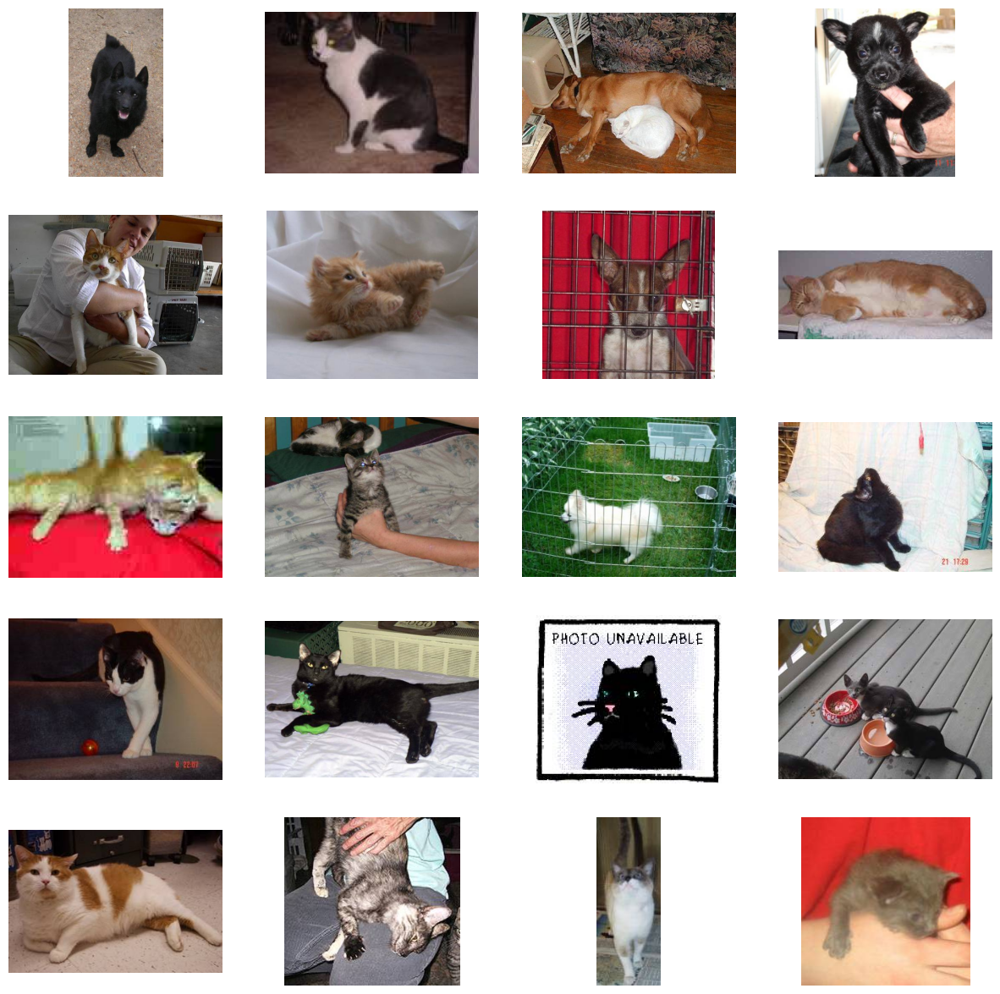

In [ ]:
# model_4
plot_wrong_preds(model_4_wrong_preds.tolist())

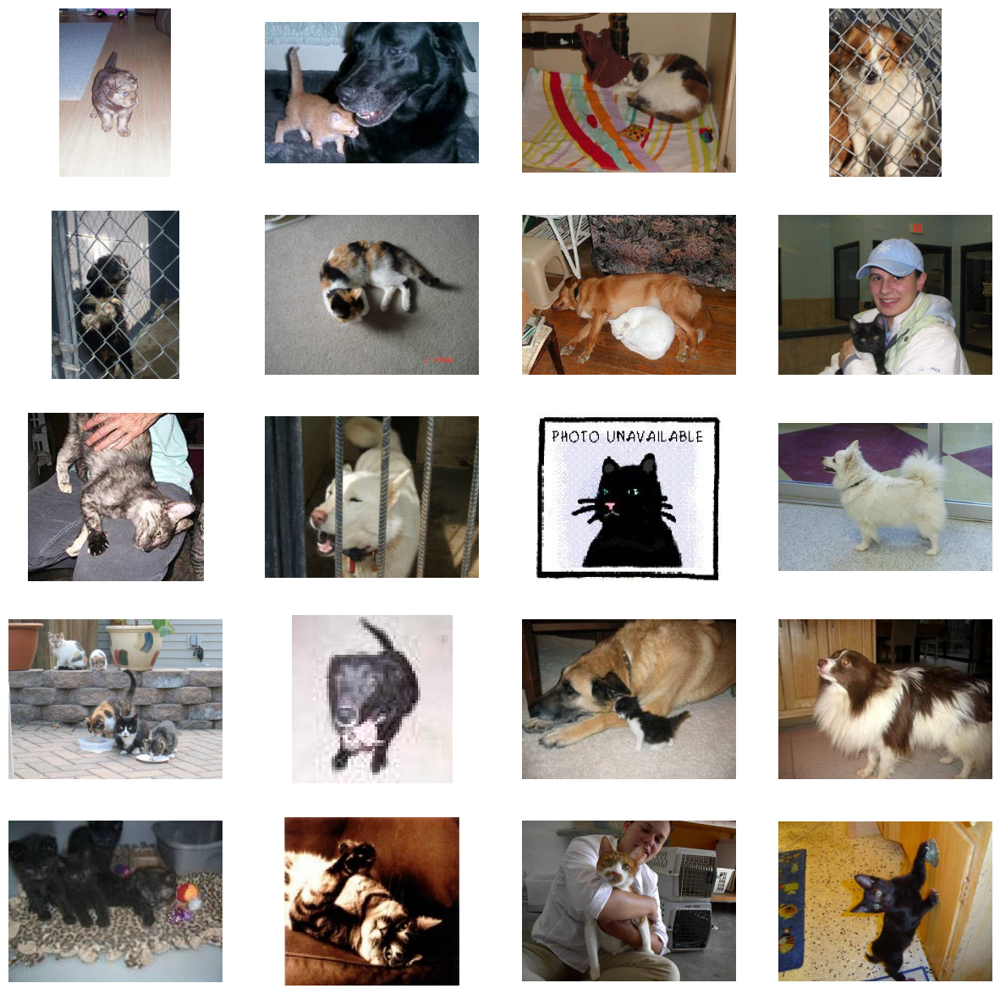

In [ ]:
plot_wrong_preds(wrong_common_preds)

We can understand now why our model is getting confused on images. There are many reasons:
1. When there is a human on the picture
2. The image a to much blurry
3. mislabel (neither cat nor dog)
4. The animal shape is not clear (the angle is bad)
5. When is animal has a black color...

Some of these problems can be fixed by:

1. remove mislabeled images
2. provide many data where the animal is alongside with an human
3. provide a better image quality
4. provide image where the animal shape is clearly visible

### 9. Use the best model on real world data

Let's download uplod some dog and cats image for our model predition. Let's Create a fuction to will preprocess the image.

In [ ]:
def preprocess_image(img_path):
  # read the image
  img = tf.io.read_file(img_path)
  # decode the image and turn it into a tensor
  img = tf.image.decode_image(img)
  # reshape the image
  img = tf.image.resize(img, size=[224, 224])
  # scale the image
  img = img /255.

  return img



def pred_and_plot_image(model, img):
  # preprocess image
  img = preprocess_image(img)
  # predict
  pred = tf.round(model.predict(tf.expand_dims(img, axis=0))).numpy()

  if pred == 0:
    title = 'cat'
  else:
    title = 'dog'
  # plot the image
  plt.imshow(img)
  plt.title(title)
  plt.axis(False)

1/1 [==============================] - 0s 191ms/step


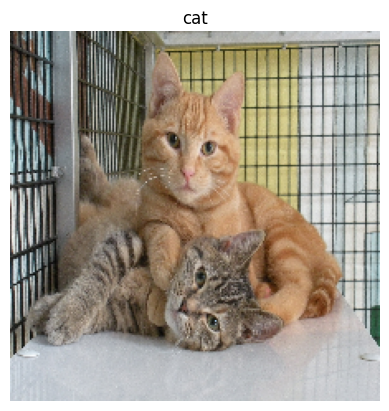

In [ ]:
pred_and_plot_image(img='cat.jpg', model=model_2)

1/1 [==============================] - 0s 64ms/step


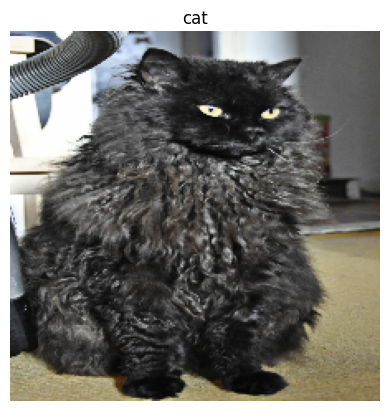

In [ ]:
pred_and_plot_image(img='cat2.jpg', model=model_2)

1/1 [==============================] - 0s 63ms/step


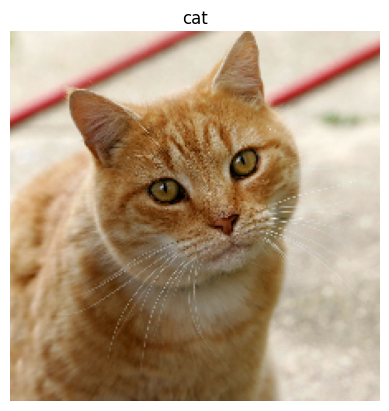

In [ ]:
pred_and_plot_image(img='Cat03.jpg', model=model_2)

1/1 [==============================] - 0s 107ms/step


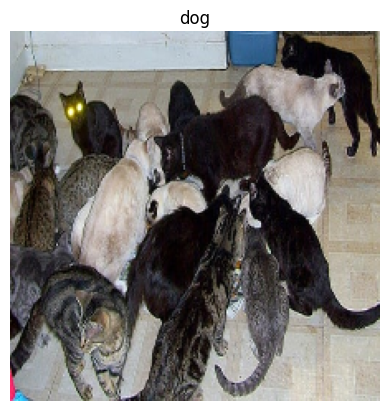

In [ ]:
pred_and_plot_image(img='many_cats.jpg', model=model_2)

1/1 [==============================] - 0s 353ms/step


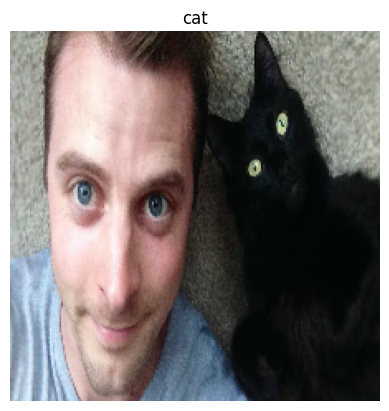

In [ ]:
pred_and_plot_image(img='cath1.jpg', model=model_2)

1/1 [==============================] - 0s 109ms/step


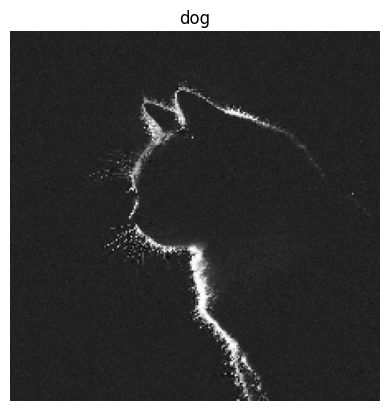

In [ ]:
pred_and_plot_image(img='darkcat.jpg', model=model_2)

1/1 [==============================] - 0s 90ms/step


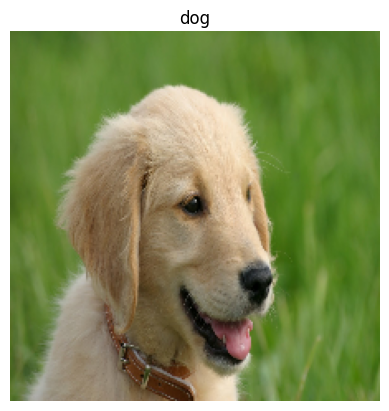

In [ ]:
pred_and_plot_image(img='dog1.jpg', model=model_2)

1/1 [==============================] - 0s 68ms/step


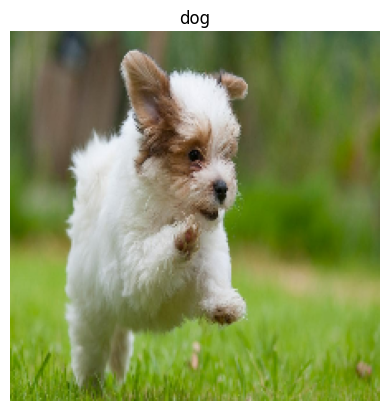

In [ ]:
pred_and_plot_image(img='dog2.jpg', model=model_2)

1/1 [==============================] - 0s 81ms/step


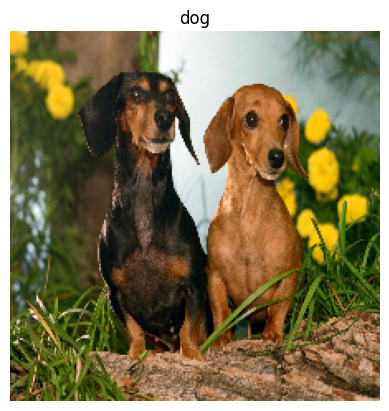

In [ ]:
pred_and_plot_image(img='dog3.jpg', model=model_2)

1/1 [==============================] - 0s 152ms/step


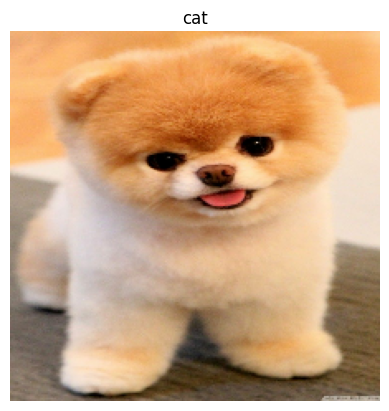

In [ ]:
pred_and_plot_image(img='dog4.jpg', model=model_2)

1/1 [==============================] - 0s 170ms/step


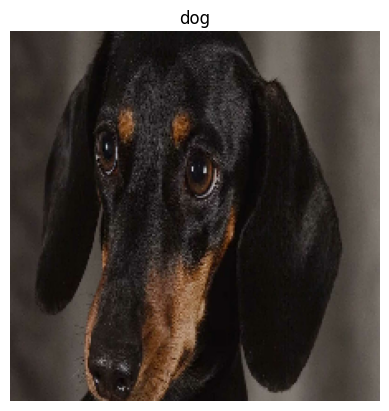

In [ ]:
pred_and_plot_image(img='dog5.jpg', model=model_2)

1/1 [==============================] - 0s 74ms/step


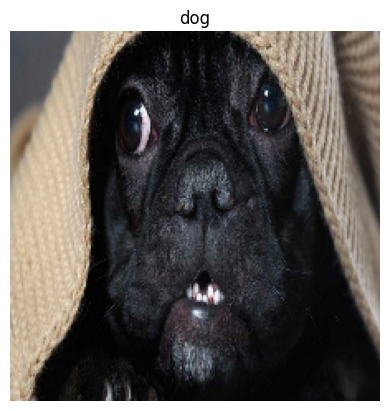

In [ ]:
pred_and_plot_image(img='dog6.jpg', model=model_2)